# Predicting value segments (market segmentation) of E-Commerce consumers based on their profitability using Clustering and Classification Methods 


### Produced by:

| Name                       | Student ID |
|----------------------------|------------|
| A S Subhashini             | 01392746   |
| Amir Syafiq Bin Abu Saiere | 01370609   |
| Daniel Choi                | 01393238   |
| Helisa Binte Salim         | 01383873   |
| Ong Xin Ya, Jasmine        | 01396585   |
| Jaye Ding                  | 01371285   |


### Note: This notebook only serves to show the code undertaken for the project. Comments only provide a brief explanation of steps undertaken. For in-depth explanaton of methodology, approach and analysis, please refer to the accompanying full project report. 

# Importing Libraries

In [3]:
import pandas as pd 
import numpy as np
import dataprep
from dataprep.eda import plot_missing,plot_diff,create_report
import seaborn as sns
import matplotlib.pyplot as plt
import matplotlib.cm as cm
import squarify

plt.style.use('ggplot')

In [4]:
from sklearn.cluster import KMeans
from sklearn.preprocessing import StandardScaler
from sklearn.metrics import silhouette_score, davies_bouldin_score, calinski_harabasz_score
from sklearn.decomposition import PCA
from kmodes.kprototypes import KPrototypes
from yellowbrick.cluster import KElbowVisualizer

In [5]:
from datetime import datetime

In [6]:
from scipy import stats

pd.set_option('display.max_columns', None)

In [7]:
import warnings
warnings.filterwarnings("ignore")

# Importing Data

In [8]:
customers_df = pd.read_csv('olist_customers_dataset.csv')
items_df = pd.read_csv('olist_order_items_dataset.csv')
geo_df = pd.read_csv('olist_geolocation_dataset.csv')
payments_df = pd.read_csv('olist_order_payments_dataset.csv')
reviews_df = pd.read_csv('olist_order_reviews_dataset.csv')
orders_df = pd.read_csv('olist_orders_dataset.csv')
products_df = pd.read_csv('olist_products_dataset.csv')
sellers_df = pd.read_csv('olist_sellers_dataset.csv')
translate_df = pd.read_csv('product_category_name_translation.csv')
cust_orders = customers_df.merge(orders_df,on='customer_id')

# Merging Dataframes

In [9]:
cop = cust_orders.merge(payments_df,on='order_id')
copi = cop.merge(items_df,on='order_id')
copip = copi.merge(products_df,on='product_id')
copipr = copip.merge(reviews_df,on='order_id')
df = copipr.merge(translate_df,on='product_category_name')

In [10]:
df.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 115609 entries, 0 to 115608
Data columns (total 37 columns):
 #   Column                         Non-Null Count   Dtype  
---  ------                         --------------   -----  
 0   customer_id                    115609 non-null  object 
 1   customer_unique_id             115609 non-null  object 
 2   customer_zip_code_prefix       115609 non-null  int64  
 3   customer_city                  115609 non-null  object 
 4   customer_state                 115609 non-null  object 
 5   order_id                       115609 non-null  object 
 6   order_status                   115609 non-null  object 
 7   order_purchase_timestamp       115609 non-null  object 
 8   order_approved_at              115595 non-null  object 
 9   order_delivered_carrier_date   114414 non-null  object 
 10  order_delivered_customer_date  113209 non-null  object 
 11  order_estimated_delivery_date  115609 non-null  object 
 12  payment_sequential            

# Data Cleaning & Preprocessing

## Exploratory Data Analysis

### Top 10 States Based on Payment Sum

In [9]:
df_2 = df.groupby('customer_unique_id',as_index=False).agg(
    {'customer_state':'first',
     'payment_value':'sum', #Total sum spent per customer (i.e Monetary)
     }) 


Text(0.5, 1.0, 'Top 10 States Based on Payment Sum')

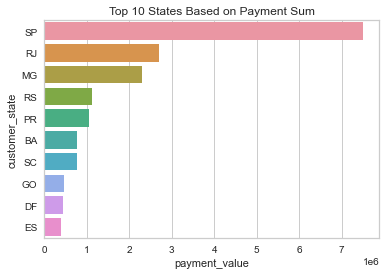

In [10]:
top_states = df_2.groupby("customer_state")['payment_value'].sum().reset_index().sort_values("payment_value", ascending = False)
ax = sns.barplot(x="payment_value", y="customer_state", data=top_states[:10])

ax.set_title("Top 10 States Based on Payment Sum")

### Number of Order per Month

In [11]:
# Converting the datatype for order_purchase_timestamp to date time instead of object
df['order_purchase_timestamp'] = pd.to_datetime(df['order_purchase_timestamp'])

In [12]:
# the number of order per month
order_monthly = df[['order_purchase_timestamp']].groupby(df['order_purchase_timestamp'].dt.to_period('M')).agg({'order_purchase_timestamp':'count'})
order_monthly = order_monthly.rename(columns = {'order_purchase_timestamp': 'num_of_orders'})
order_monthly = order_monthly.reset_index()

# adding column for month name and year 
order_monthly['month_year'] = order_monthly['order_purchase_timestamp'].dt.strftime('%b-%Y')
order_monthly.head()

,order_purchase_timestamp,num_of_orders,month_year
0,2016-09,3,Sep-2016
1,2016-10,377,Oct-2016
2,2016-12,1,Dec-2016
3,2017-01,998,Jan-2017
4,2017-02,1999,Feb-2017


Using categorical units to plot a list of strings that are all parsable as floats or dates. If these strings should be plotted as numbers, cast to the appropriate data type before plotting.
Using categorical units to plot a list of strings that are all parsable as floats or dates. If these strings should be plotted as numbers, cast to the appropriate data type before plotting.


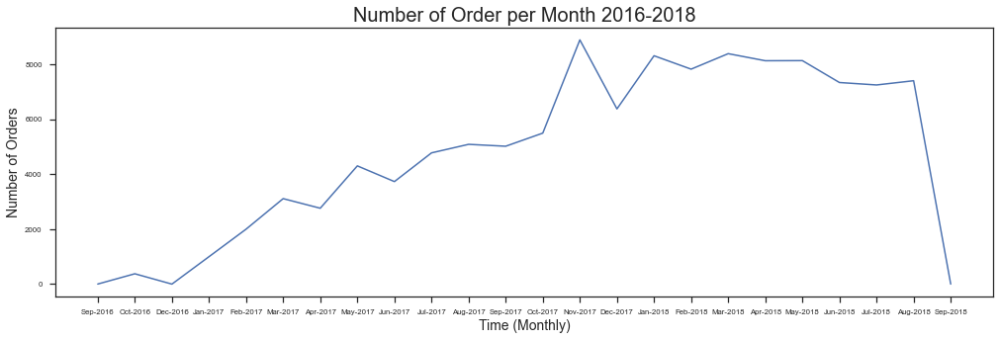

In [13]:
plt.figure(figsize=(17,5))
sns.set_theme(style="ticks", font_scale=0.7)

order_monthly_fig = sns.lineplot(x = 'month_year', y = 'num_of_orders', data = order_monthly)
order_monthly_fig.set_title('Number of Order per Month 2016-2018',fontsize = 20)
order_monthly_fig.set_xlabel('Time (Monthly)',fontsize = 14)
order_monthly_fig.set_ylabel('Number of Orders',fontsize = 14)

plt.show()

### Number of Orders by Hour

In [14]:
orderbyhour = df.groupby(df["order_purchase_timestamp"].dt.hour)["order_id"].count().reset_index().sort_values(by="order_purchase_timestamp", ascending=False)
orderbyhour.rename(columns={"order_id":"Total Orders", "order_purchase_timestamp": "Hour of Day"}, inplace=True)

Text(0.5, 1.0, 'Number of Orders by Hour')

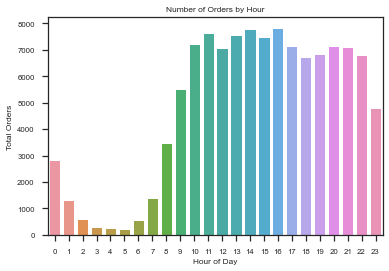

In [15]:
ax = sns.barplot(x="Hour of Day", y="Total Orders", data=orderbyhour)
ax.set_title("Number of Orders by Hour")

## Preliminary Feature Selection

In [12]:
preliminary_features = ['customer_id', 'customer_unique_id','customer_city', 'customer_state', 'order_id', 'order_status',
                        'order_purchase_timestamp','payment_sequential', 'payment_type','payment_installments', 'payment_value', 
                        'order_item_id', 'product_id','seller_id', 'price', 'freight_value',
                        'review_id', 'review_score', 'review_comment_title','review_comment_message',
                        'product_category_name_english']

In [13]:
merged_df = df[preliminary_features]

In [14]:
# Only review_comment_title and review_comment_message have null values
# order_purchase_timestamp to be converted to datetime object
merged_df.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 115609 entries, 0 to 115608
Data columns (total 21 columns):
 #   Column                         Non-Null Count   Dtype  
---  ------                         --------------   -----  
 0   customer_id                    115609 non-null  object 
 1   customer_unique_id             115609 non-null  object 
 2   customer_city                  115609 non-null  object 
 3   customer_state                 115609 non-null  object 
 4   order_id                       115609 non-null  object 
 5   order_status                   115609 non-null  object 
 6   order_purchase_timestamp       115609 non-null  object 
 7   payment_sequential             115609 non-null  int64  
 8   payment_type                   115609 non-null  object 
 9   payment_installments           115609 non-null  int64  
 10  payment_value                  115609 non-null  float64
 11  order_item_id                  115609 non-null  int64  
 12  product_id                    

In [15]:
subset_df = merged_df[['customer_unique_id','customer_id','order_id','customer_state','customer_city',
                      'order_purchase_timestamp','payment_installments','payment_value','review_score','product_category_name_english',
                      'payment_type']]

## Check for & Remove Duplicated Data

In [16]:
subset_df[subset_df.duplicated()]

,customer_unique_id,customer_id,order_id,customer_state,customer_city,order_purchase_timestamp,payment_installments,payment_value,review_score,product_category_name_english,payment_type
2,9eae34bbd3a474ec5d07949ca7de67c0,8912fc0c3bbf1e2fbf35819e21706718,c1d2b34febe9cd269e378117d6681172,PA,santarem,2017-11-09 00:50:13,1,275.79,1,office_furniture,credit_card
10,31318a0597cd9d50ce4cfd03c80fe780,20a452f528d487411fd7d3ebda1d0f20,1c7fe02ac4c7be50c59afb295cf85b89,MG,santa rita do sapucai,2018-01-26 13:22:09,1,257.50,2,office_furniture,boleto
12,83aca63b2193ea126b287f3ae61528d9,62f766c82849282806bf2f62ca86432e,5ee63c8c9ae2e5c38791b35932cf4c69,SC,gaspar,2017-05-09 11:30:18,6,843.66,4,office_furniture,credit_card
13,83aca63b2193ea126b287f3ae61528d9,62f766c82849282806bf2f62ca86432e,5ee63c8c9ae2e5c38791b35932cf4c69,SC,gaspar,2017-05-09 11:30:18,6,843.66,4,office_furniture,credit_card
14,83aca63b2193ea126b287f3ae61528d9,62f766c82849282806bf2f62ca86432e,5ee63c8c9ae2e5c38791b35932cf4c69,SC,gaspar,2017-05-09 11:30:18,6,843.66,4,office_furniture,credit_card
...,...,...,...,...,...,...,...,...,...,...,...
115547,e59715fbe8afb24703988a8c1c14351e,b701465c5960839259de1bc16655ef0a,eeacc2219efa996957aa46ab696afbde,RS,guaiba,2018-06-26 17:57:47,1,100.92,5,cine_photo,boleto
115548,e59715fbe8afb24703988a8c1c14351e,b701465c5960839259de1bc16655ef0a,eeacc2219efa996957aa46ab696afbde,RS,guaiba,2018-06-26 17:57:47,1,100.92,5,cine_photo,boleto
115577,92f65b75e3c4a45c14f410b4aac4db69,328d7a69cb9cbaf088eed3ed778804bb,37104fd8b73d0691fda9491fe8906808,RS,mato leitao,2017-07-05 09:16:49,1,122.22,4,cds_dvds_musicals,boleto
115581,b8b6643025dbcaa0e516a72f6d0d0717,f81bb64a1e672e6cbd0e027046db8533,615ca9b2afeaf5644ae8cef64797132e,RS,porto alegre,2017-08-07 17:20:26,1,122.22,5,cds_dvds_musicals,boleto


In [17]:
# Drop duplicates but keep first record
subset_df.drop_duplicates(keep='first', inplace=True)

In [18]:
subset_df.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 101231 entries, 0 to 115608
Data columns (total 11 columns):
 #   Column                         Non-Null Count   Dtype  
---  ------                         --------------   -----  
 0   customer_unique_id             101231 non-null  object 
 1   customer_id                    101231 non-null  object 
 2   order_id                       101231 non-null  object 
 3   customer_state                 101231 non-null  object 
 4   customer_city                  101231 non-null  object 
 5   order_purchase_timestamp       101231 non-null  object 
 6   payment_installments           101231 non-null  int64  
 7   payment_value                  101231 non-null  float64
 8   review_score                   101231 non-null  int64  
 9   product_category_name_english  101231 non-null  object 
 10  payment_type                   101231 non-null  object 
dtypes: float64(1), int64(2), object(8)
memory usage: 9.3+ MB


## Check for Missing Data

  0%|                                                                                          | 0/154 [00:00<…


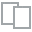
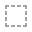
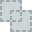
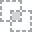
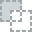
...
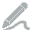
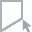
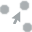
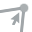
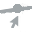

In [19]:
plot_missing(subset_df)

## Preprocessing

### Changing Datetime Data Types

In [23]:
#Convert Order Purchase Timestamp to Datetime object
subset_df['order_purchase_timestamp'] = pd.to_datetime(subset_df['order_purchase_timestamp'])

### Creating Dummy Variables for Payment_type

In [24]:
subset_df['payment_type'].value_counts()

credit_card    75324
boleto         19391
voucher         5020
debit_card      1496
Name: payment_type, dtype: int64

In [25]:
subset_df = pd.get_dummies(subset_df,columns=['payment_type'],drop_first=False,prefix="",prefix_sep="")

In [26]:
subset_df.head()

,customer_unique_id,customer_id,order_id,customer_state,customer_city,order_purchase_timestamp,payment_installments,payment_value,review_score,product_category_name_english,boleto,credit_card,debit_card,voucher
0,861eff4711a542e4b93843c6dd7febb0,06b8999e2fba1a1fbc88172c00ba8bc7,00e7ee1b050b8499577073aeb2a297a1,SP,franca,2017-05-16 15:05:35,2,146.87,4,office_furniture,0,1,0,0
1,9eae34bbd3a474ec5d07949ca7de67c0,8912fc0c3bbf1e2fbf35819e21706718,c1d2b34febe9cd269e378117d6681172,PA,santarem,2017-11-09 00:50:13,1,275.79,1,office_furniture,0,1,0,0
3,3c799d181c34d51f6d44bbbc563024db,f0ac8e5a239118859b1734e1087cbb1f,b1a5d5365d330d10485e0203d54ab9e8,RS,nova santa rita,2017-05-07 20:11:26,7,140.61,3,office_furniture,0,1,0,0
4,23397e992b09769faf5e66f9e171a241,6bc8d08963a135220ed6c6d098831f84,2e604b3614664aa66867856dba7e61b7,RJ,mage,2018-02-03 19:45:40,10,137.58,4,office_furniture,0,1,0,0
5,567ab47ca4deb92d46dbf54dce07d0a7,fd3a0b1bd209f0e7d420c9c3d1127613,574fe1739f65af76badd0999db300b4f,SC,angelina,2017-03-23 15:10:17,5,142.05,4,office_furniture,0,1,0,0


### Rename Columns

In [27]:
subset_df = subset_df.rename(columns={"product_category_name_english": "product_category"})

In [28]:
subset_df.head()

,customer_unique_id,customer_id,order_id,customer_state,customer_city,order_purchase_timestamp,payment_installments,payment_value,review_score,product_category,boleto,credit_card,debit_card,voucher
0,861eff4711a542e4b93843c6dd7febb0,06b8999e2fba1a1fbc88172c00ba8bc7,00e7ee1b050b8499577073aeb2a297a1,SP,franca,2017-05-16 15:05:35,2,146.87,4,office_furniture,0,1,0,0
1,9eae34bbd3a474ec5d07949ca7de67c0,8912fc0c3bbf1e2fbf35819e21706718,c1d2b34febe9cd269e378117d6681172,PA,santarem,2017-11-09 00:50:13,1,275.79,1,office_furniture,0,1,0,0
3,3c799d181c34d51f6d44bbbc563024db,f0ac8e5a239118859b1734e1087cbb1f,b1a5d5365d330d10485e0203d54ab9e8,RS,nova santa rita,2017-05-07 20:11:26,7,140.61,3,office_furniture,0,1,0,0
4,23397e992b09769faf5e66f9e171a241,6bc8d08963a135220ed6c6d098831f84,2e604b3614664aa66867856dba7e61b7,RJ,mage,2018-02-03 19:45:40,10,137.58,4,office_furniture,0,1,0,0
5,567ab47ca4deb92d46dbf54dce07d0a7,fd3a0b1bd209f0e7d420c9c3d1127613,574fe1739f65af76badd0999db300b4f,SC,angelina,2017-03-23 15:10:17,5,142.05,4,office_furniture,0,1,0,0


## Feature Engineering

### Create Order Recency Column

Recency = Days since last order

In [29]:
subset_df['order_recency'] = max(subset_df['order_purchase_timestamp']) - subset_df['order_purchase_timestamp']
subset_df['order_recency'] = subset_df['order_recency'].dt.days

### Aggregate customer level and creating Frequency Column and Monetary Column

In [30]:
grouped_df = subset_df.groupby('customer_unique_id',as_index=False).agg(
    {'order_purchase_timestamp':'max',
     'customer_state':'first',
     'customer_id': pd.Series.nunique, #Frequency of orders
     'payment_installments':'mean',
     'payment_value':'sum', #Total sum spent per customer (i.e Monetary)
     'review_score':'mean',
     'product_category':set,
    'boleto':'mean', #Mean is used to obten proportion of customer order made using Boleto
    'credit_card':'mean', #Mean is used to obten proportion of customer order made using Credit Card
    'debit_card':'mean', #Mean is used to obten proportion of customer order made using Debit Card
    'voucher':'mean', #Mean is used to obten proportion of customer order made using Voucher
    'order_recency':'min'}) #Most Recent Order


grouped_df= grouped_df.rename(columns={'order_purchase_timestamp':'latest_order',
                                       'customer_id':'frequency',
                                       'payment_installments':'mean_num_installments',
                                       'payment_value':'monetary',
                                       'review_score':'mean_review_score', 
                                       'order_recency':'recency'
                                      })

In [31]:
grouped_df.head()

,customer_unique_id,latest_order,customer_state,frequency,mean_num_installments,monetary,mean_review_score,product_category,boleto,credit_card,debit_card,voucher,recency
0,0000366f3b9a7992bf8c76cfdf3221e2,2018-05-10 10:56:27,SP,1,8.0,141.90,5.0,{bed_bath_table},0.0,1.0,0.0,0.0,115
1,0000b849f77a49e4a4ce2b2a4ca5be3f,2018-05-07 11:11:27,SP,1,1.0,27.19,4.0,{health_beauty},0.0,1.0,0.0,0.0,118
2,0000f46a3911fa3c0805444483337064,2017-03-10 21:05:03,SC,1,8.0,86.22,3.0,{stationery},0.0,1.0,0.0,0.0,541
3,0000f6ccb0745a6a4b88665a16c9f078,2017-10-12 20:29:41,PA,1,4.0,43.62,4.0,{telephony},0.0,1.0,0.0,0.0,325
4,0004aac84e0df4da2b147fca70cf8255,2017-11-14 19:45:42,SP,1,6.0,196.89,5.0,{telephony},0.0,1.0,0.0,0.0,292


### Adding a column for most expensive product category purchased by customer

In [32]:
best_cat = subset_df[['customer_unique_id','product_category','payment_value']].sort_values('payment_value')\
.drop_duplicates('customer_unique_id',keep='last')
best_cat = best_cat.rename(columns={'product_category':'most_exp_category'})

In [33]:
grouped_df = grouped_df.merge(best_cat[['customer_unique_id','most_exp_category']],on='customer_unique_id')

In [34]:
grouped_df.head()

,customer_unique_id,latest_order,customer_state,frequency,mean_num_installments,monetary,mean_review_score,product_category,boleto,credit_card,debit_card,voucher,recency,most_exp_category
0,0000366f3b9a7992bf8c76cfdf3221e2,2018-05-10 10:56:27,SP,1,8.0,141.90,5.0,{bed_bath_table},0.0,1.0,0.0,0.0,115,bed_bath_table
1,0000b849f77a49e4a4ce2b2a4ca5be3f,2018-05-07 11:11:27,SP,1,1.0,27.19,4.0,{health_beauty},0.0,1.0,0.0,0.0,118,health_beauty
2,0000f46a3911fa3c0805444483337064,2017-03-10 21:05:03,SC,1,8.0,86.22,3.0,{stationery},0.0,1.0,0.0,0.0,541,stationery
3,0000f6ccb0745a6a4b88665a16c9f078,2017-10-12 20:29:41,PA,1,4.0,43.62,4.0,{telephony},0.0,1.0,0.0,0.0,325,telephony
4,0004aac84e0df4da2b147fca70cf8255,2017-11-14 19:45:42,SP,1,6.0,196.89,5.0,{telephony},0.0,1.0,0.0,0.0,292,telephony


### Exploratory Data Analysis (EDA) - Scatterplots

<AxesSubplot: xlabel='frequency', ylabel='monetary'>

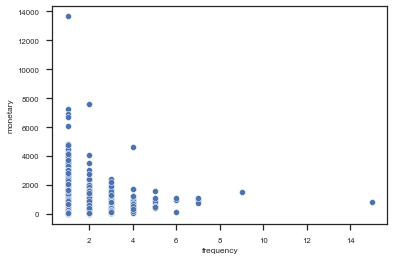

In [36]:
sns.scatterplot(x="frequency", y="monetary", data=grouped_df)

<AxesSubplot: xlabel='recency', ylabel='monetary'>

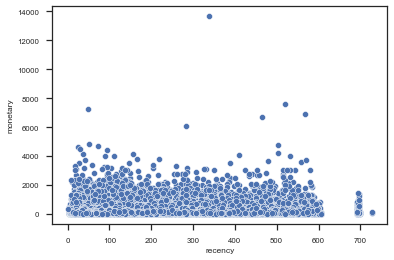

In [37]:
sns.scatterplot(x="recency", y="monetary", data=grouped_df)

<AxesSubplot: xlabel='mean_review_score', ylabel='monetary'>

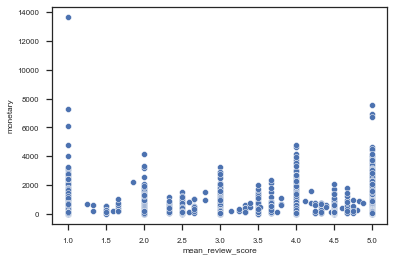

In [38]:
sns.scatterplot(x="mean_review_score", y="monetary", data=grouped_df)

<AxesSubplot: xlabel='mean_num_installments', ylabel='monetary'>

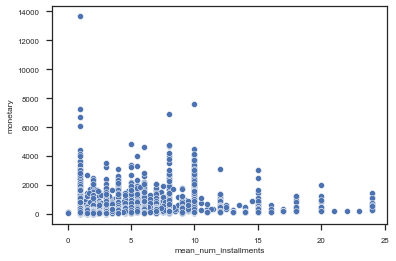

In [39]:
sns.scatterplot(x="mean_num_installments", y="monetary", data=grouped_df)

# Market Segmentation

## RFM method

In [28]:
rfm_df = grouped_df[['customer_unique_id','recency','frequency','monetary']]

In [29]:
rfm_df.head()

,customer_unique_id,recency,frequency,monetary
0,0000366f3b9a7992bf8c76cfdf3221e2,115,1,141.90
1,0000b849f77a49e4a4ce2b2a4ca5be3f,118,1,27.19
2,0000f46a3911fa3c0805444483337064,541,1,86.22
3,0000f6ccb0745a6a4b88665a16c9f078,325,1,43.62
4,0004aac84e0df4da2b147fca70cf8255,292,1,196.89


In [30]:
rfm_df.describe().T

,count,mean,std,min,25%,50%,75%,max
recency,93396.0,241.744250,153.164721,0.00,118.00,222.00,351.0000,728.00
frequency,93396.0,1.033406,0.208235,1.00,1.00,1.00,1.0000,15.00
monetary,93396.0,168.141377,232.337869,8.86,63.09,107.85,184.8725,13664.08


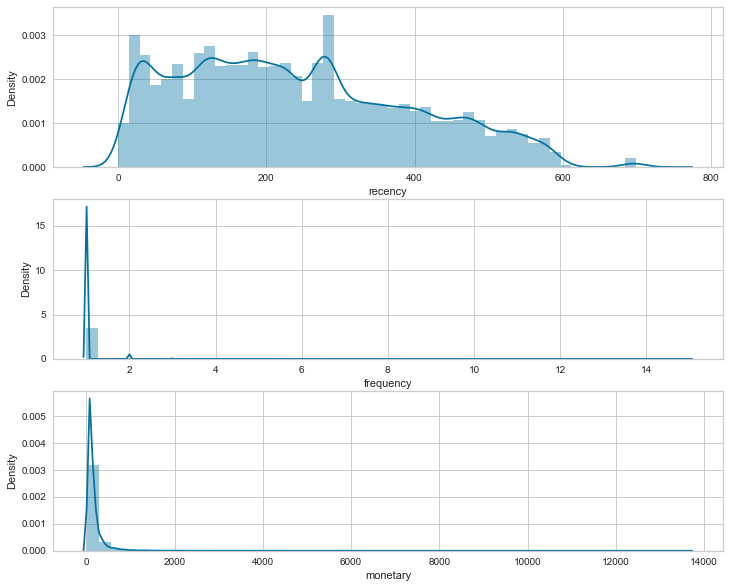

In [31]:
plt.figure(figsize=(12, 10))
plt.subplot(3, 1, 1); sns.distplot(rfm_df['recency'])
plt.subplot(3, 1, 2); sns.distplot(rfm_df['frequency'])
plt.subplot(3, 1, 3); sns.distplot(rfm_df['monetary'])
plt.show()

### Checking Outliers

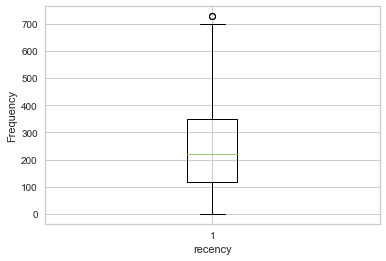

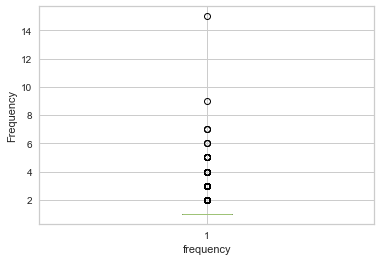

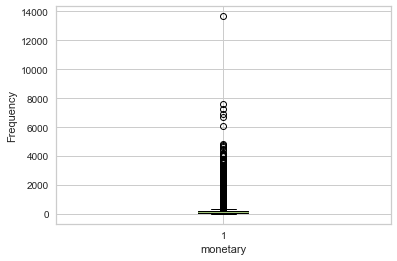

In [32]:
for i in ["recency", "frequency", "monetary"]:
    plt.figure()
    plt.tight_layout()
    plt.gca().set(xlabel= i, ylabel='Frequency')
    plt.boxplot(rfm_df[i])

### IQR Method

In [33]:
def num_outlier_iqr(df_in, col_name):
    q1 = df_in[col_name].quantile(0.25)
    q3 = df_in[col_name].quantile(0.75)
    iqr = q3-q1 #Interquartile range
    fence_low  = q1-1.5*iqr
    fence_high = q3+1.5*iqr
    outliers_df= df_in.loc[(df_in[col_name] < fence_low) | (df_in[col_name] > fence_high)]
    print('Column:',col_name)
    print(f'Lower Bound: {fence_low}',f'Upper Bound {fence_high}')
    return print("Number of outliers in {} column: ".format(col_name), len(outliers_df)), print("Indexes: ", outliers_df.index),print()

In [34]:
for i in ["recency", "frequency", "monetary"]:
    num_outlier_iqr(rfm_df, i)
    print("*"*40)

Column: recency
Lower Bound: -231.5 Upper Bound 700.5
Number of outliers in recency column:  2
Indexes:  Int64Index([26477, 67181], dtype='int64')

****************************************
Column: frequency
Lower Bound: 1.0 Upper Bound 1.0
Number of outliers in frequency column:  2807
Indexes:  Int64Index([  104,   120,   140,   243,   305,   404,   419,   428,   438,
              467,
            ...
            92799, 92856, 92956, 92960, 93027, 93071, 93123, 93228, 93244,
            93352],
           dtype='int64', length=2807)

****************************************
Column: monetary
Lower Bound: -119.58374999999998 Upper Bound 367.54625
Number of outliers in monetary column:  7571
Indexes:  Int64Index([    7,    22,    71,    75,    78,    85,    97,   102,   123,
              129,
            ...
            93238, 93268, 93302, 93345, 93350, 93363, 93369, 93384, 93390,
            93391],
           dtype='int64', length=7571)

****************************************


### Standard Deviation Method

In [35]:
def num_outlier_std(df_in, col_name):
    standard_deviation = df_in[col_name].std()
    mean = df_in[col_name].mean()
    fence_low  =  round(mean - 3*standard_deviation,2)
    fence_high = round(mean + 3*standard_deviation,2)
    outliers_df= df_in.loc[(df_in[col_name] < fence_low) | (df_in[col_name] > fence_high)]
    print('Column:',col_name)
    print(f'Lower Bound: {fence_low}',f'Upper Bound {fence_high}')
    return print("Number of outliers in {} column: ".format(col_name), len(outliers_df)), print("Indexes: ", outliers_df.index),print()

In [36]:
for i in ["recency", "frequency", "monetary"]:
    num_outlier_std(rfm_df, i)
    print("*"*40)

Column: recency
Lower Bound: -217.75 Upper Bound 701.24
Number of outliers in recency column:  2
Indexes:  Int64Index([26477, 67181], dtype='int64')

****************************************
Column: frequency
Lower Bound: 0.41 Upper Bound 1.66
Number of outliers in frequency column:  2807
Indexes:  Int64Index([  104,   120,   140,   243,   305,   404,   419,   428,   438,
              467,
            ...
            92799, 92856, 92956, 92960, 93027, 93071, 93123, 93228, 93244,
            93352],
           dtype='int64', length=2807)

****************************************
Column: monetary
Lower Bound: -528.87 Upper Bound 865.15
Number of outliers in monetary column:  1645
Indexes:  Int64Index([  123,   129,   183,   256,   288,   416,   437,   438,   440,
              463,
            ...
            93042, 93081, 93119, 93166, 93188, 93238, 93302, 93350, 93384,
            93391],
           dtype='int64', length=1645)

****************************************


## Investigating Outliers

In [37]:
rfm_df.describe().T

,count,mean,std,min,25%,50%,75%,max
recency,93396.0,241.744250,153.164721,0.00,118.00,222.00,351.0000,728.00
frequency,93396.0,1.033406,0.208235,1.00,1.00,1.00,1.0000,15.00
monetary,93396.0,168.141377,232.337869,8.86,63.09,107.85,184.8725,13664.08


Looking at min and max values of RFM we can see that:
- Recency of 0 and 728 means top customer bought 0 days ago and bottom customer bought 728 days ago. This is reasonable
- Frequency of 1 and 15 means a customer bought once and another bought 15 times. This is reasonable
- Monetary min of ``R$8.86`` and max ``R$13,664``which translates to ``SGD2.50`` and max ``SGD3790` respectively. This too may be reasonable but we will investigate further to see if it is justified

In [38]:
# The most expensive item bought on Shopee in 2017 was worth $2,500 SGD 
# We look at purchases above $2500 SGD which translates to R$8,992
grouped_df[grouped_df['monetary']>8992]

,customer_unique_id,latest_order,customer_state,frequency,mean_num_installments,monetary,mean_review_score,product_category,boleto,credit_card,debit_card,voucher,recency,most_exp_category
3724,0a0a92112bd4c708ca5fde585afaa872,2017-09-29 15:24:52,RJ,1,1.0,13664.08,1.0,{fixed_telephony},0.0,1.0,0.0,0.0,338,fixed_telephony


In [39]:
# Mean price for fixed landlines is R$308. R$13664 seems extreme. We remove this row
grouped_df[grouped_df['product_category'] == {'fixed_telephony'}]['monetary'].mean()

308.56825870646765

In [40]:
rfm_df = rfm_df[rfm_df['customer_unique_id'] != '0a0a92112bd4c708ca5fde585afaa872']

In [41]:
grouped_df = grouped_df[grouped_df['customer_unique_id'] != '0a0a92112bd4c708ca5fde585afaa872']
df = df[df['customer_unique_id'] != '0a0a92112bd4c708ca5fde585afaa872']

In [42]:
rfm_df.describe().T

,count,mean,std,min,25%,50%,75%,max
recency,93395.0,241.743220,153.165218,0.00,118.00,222.00,351.00,728.00
frequency,93395.0,1.033406,0.208236,1.00,1.00,1.00,1.00,15.00
monetary,93395.0,167.996873,228.103499,8.86,63.09,107.85,184.87,7571.63


- Monetary max ``R$7571.63``which translates to SGD2100 is reasonable. We do not remove any more data

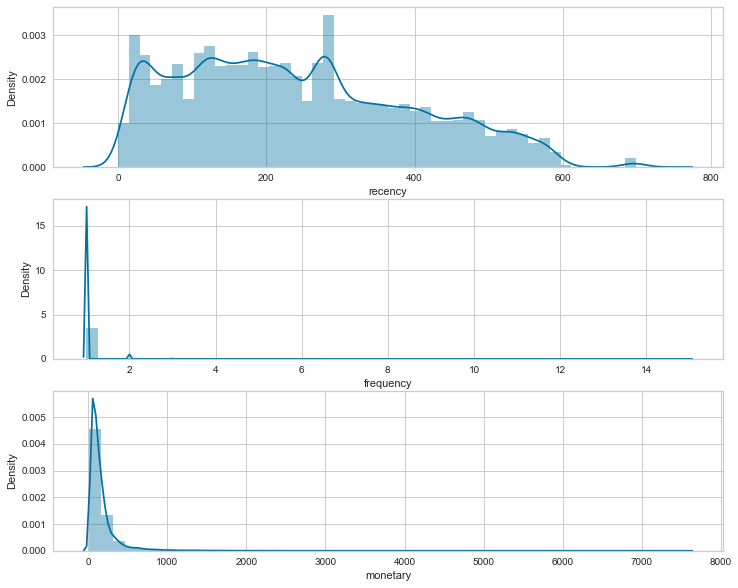

In [43]:
# Data is still highly skewed to the right
plt.figure(figsize=(12, 10))
plt.subplot(3, 1, 1); sns.distplot(rfm_df['recency'])
plt.subplot(3, 1, 2); sns.distplot(rfm_df['frequency'])
plt.subplot(3, 1, 3); sns.distplot(rfm_df['monetary'])
plt.show()

### RFM Scoring 

In [44]:
rfm_df["recency_score"]  = pd.qcut(rfm_df['recency'], 5, labels=[5, 4, 3, 2, 1])
rfm_df["frequency_score"]= pd.qcut(rfm_df['frequency'].rank(method="first"), 5, labels=[1, 2, 3, 4, 5])
rfm_df["monetary_score"] = pd.qcut(rfm_df['monetary'], 5, labels=[1, 2, 3, 4, 5])

#### Concatednated RFM scores

In [45]:
rfm_df['rfm_score'] = rfm_df['recency_score'].astype(str)+ rfm_df['frequency_score'].astype(str) + rfm_df['monetary_score'].astype(str)

In [46]:
rfm_df.head()

,customer_unique_id,recency,frequency,monetary,recency_score,frequency_score,monetary_score,rfm_score
0,0000366f3b9a7992bf8c76cfdf3221e2,115,1,141.90,4,1,4,414
1,0000b849f77a49e4a4ce2b2a4ca5be3f,118,1,27.19,4,1,1,411
2,0000f46a3911fa3c0805444483337064,541,1,86.22,1,1,2,112
3,0000f6ccb0745a6a4b88665a16c9f078,325,1,43.62,2,1,1,211
4,0004aac84e0df4da2b147fca70cf8255,292,1,196.89,2,1,4,214


### Mapping RFM Scores to Segment

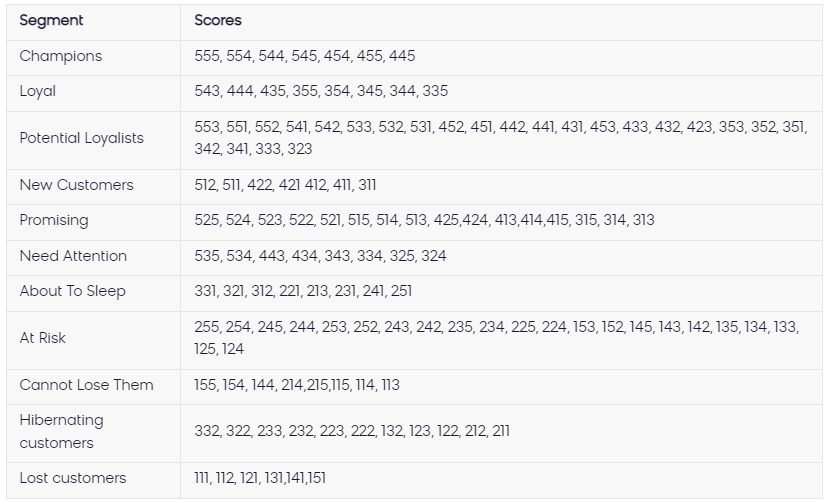

Source: https://documentation.bloomreach.com/engagement/docs/rfm-segmentation#rfm-segments

In [47]:
seg_map= {
    r'111|112|121|131|141|151': 'Lost customers',
    r'332|322|233|232|223|222|132|123|122|212|211': 'Hibernating customers', 
    r'155|154|144|214|215|115|114|113': 'Cannot Lose Them',
    r'255|254|245|244|253|252|243|242|235|234|225|224|153|152|145|143|142|135|134|133|125|124': 'At Risk',
    r'331|321|312|221|213|231|241|251': 'About To Sleep',
    r'535|534|443|434|343|334|325|324': 'Need Attention',
    r'525|524|523|522|521|515|514|513|425|424|413|414|415|315|314|313': 'Promising',
    r'512|511|422|421|412|411|311': 'New Customers',
    r'553|551|552|541|542|533|532|531|452|451|442|441|431|453|433|432|423|353|352|351|342|341|333|323': 'Potential Loyalist',
    r'543|444|435|355|354|345|344|335': 'Loyal',
    r'555|554|544|545|454|455|445': 'Champions'
}

In [48]:
rfm_df['segment'] = rfm_df['rfm_score']
rfm_df['segment'] = rfm_df['segment'].replace(seg_map, regex=True)

In [49]:
rfm_df.head()

,customer_unique_id,recency,frequency,monetary,recency_score,frequency_score,monetary_score,rfm_score,segment
0,0000366f3b9a7992bf8c76cfdf3221e2,115,1,141.90,4,1,4,414,Promising
1,0000b849f77a49e4a4ce2b2a4ca5be3f,118,1,27.19,4,1,1,411,New Customers
2,0000f46a3911fa3c0805444483337064,541,1,86.22,1,1,2,112,Lost customers
3,0000f6ccb0745a6a4b88665a16c9f078,325,1,43.62,2,1,1,211,Hibernating customers
4,0004aac84e0df4da2b147fca70cf8255,292,1,196.89,2,1,4,214,Cannot Lose Them


In [50]:
rfm_df['segment'].value_counts()

Potential Loyalist       17568
At Risk                  16170
Promising                12020
Hibernating customers     8476
Loyal                     6061
About To Sleep            5871
Cannot Lose Them          5860
Need Attention            5777
Champions                 5729
New Customers             5201
Lost customers            4662
Name: segment, dtype: int64

In [51]:
# Statistical Summary of each Segment
rfm_stats = rfm_df[["segment", "recency", "frequency", "monetary"]].groupby("segment").agg(['mean','median', 'min', 'max', 'count'])

In [52]:
rfm_stats['proportion'] = (100*rfm_stats['monetary']["count"]/rfm_stats['monetary']["count"].sum()).round(2)

In [53]:
# Order by most valuable consumers to least valuable consumers
rfm_stats = rfm_stats.reindex(["Champions", "Loyal", "Potential Loyalist","New Customers","Promising","Need Attention",
                      "About To Sleep","At Risk","Cannot Lose Them","Hibernating customers","Lost customers"])

In [54]:
rfm_stats

recency                         frequency         \
                             mean median  min  max  count      mean median   
segment                                                                      
Champions               88.330773   85.0    0  180   5729  1.202828    1.0   
Loyal                  180.932519  195.0    4  272   6061  1.092724    1.0   
Potential Loyalist     134.024419  133.0    4  272  17568  1.018386    1.0   
New Customers          127.194770  130.0    4  272   5201  1.000000    1.0   
Promising              109.202496   95.0    4  272  12020  1.000000    1.0   
Need Attention         160.050026  181.0    5  272   5777  1.000000    1.0   
About To Sleep         281.030319  282.0  181  387   5871  1.000511    1.0   
At Risk                390.563513  371.0  273  699  16170  1.043290    1.0   
Cannot Lose Them       440.542150  442.0  273  728   5860  1.061604    1.0   
Hibernating customers  346.574210  330.0  181  728   8476  1.000000    1.0   
Lost customers         479.867868  473.0  388  699   4662  1.001931    1.0   

                                        monetary                            \
                      min max  count        mean   median     min      max   
segment                                                                      
Champions               1  15   5729  343.378893  232.230  133.25  4655.91   
Loyal                   1   9   6061  290.708020  210.540   87.42  3826.80   
Potential Loyalist      1   3  17568   73.127194   69.735   10.89   133.22   
New Customers           1   1   5201   52.409783   50.870    9.59    87.41   
Promising               1   1  12020  221.769130  155.915   10.71  4809.44   
Need Attention          1   1   5777  220.619057  163.240   87.43  7274.88   
About To Sleep          1   2   5871   51.777937   44.530   10.07   133.22   
At Risk                 1   6  16170  228.572263  152.040   55.24  6081.54   
Cannot Lose Them        1   4   5860  271.748596  186.390   87.53  7571.63   
Hibernating customers   1   1   8476   77.971582   74.155   11.63   133.22   
Lost customers          1   3   4662   45.060120   43.500    8.86    87.27   

                             proportion  
                       count             
segment                                  
Champions               5729       6.13  
Loyal                   6061       6.49  
Potential Loyalist     17568      18.81  
New Customers           5201       5.57  
Promising              12020      12.87  
Need Attention          5777       6.19  
About To Sleep          5871       6.29  
At Risk                16170      17.31  
Cannot Lose Them        5860       6.27  
Hibernating customers   8476       9.08  
Lost customers          4662       4.99

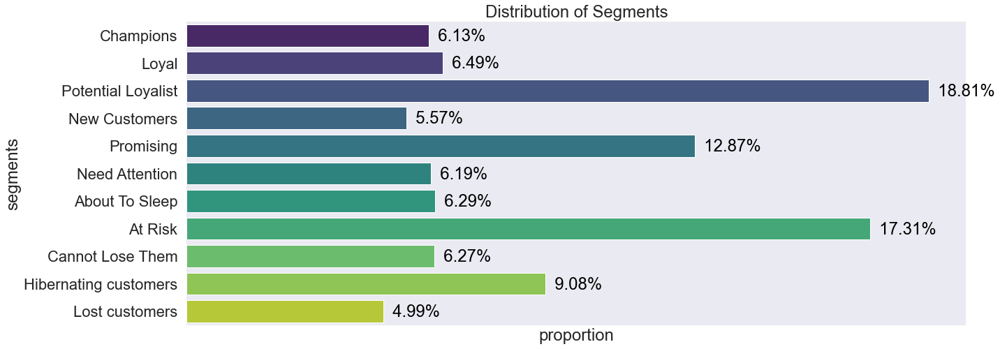

In [55]:
# Order by most valuable consumers to least valuable consumers
plt.figure(figsize=(20,8))
sns.set(font_scale=2)
per = sns.barplot(x=rfm_stats['proportion'], y=rfm_stats.index, palette="viridis")
sns.despine(bottom = True, left = True)
for i, v in enumerate(rfm_stats['proportion']):
    per.text(v, i+.20,"  {:.2f}".format(v)+"%", color='black', ha="left")
per.set_ylabel('segments',)
per.set(xticks=[])
plt.title('Distribution of Segments')
plt.show()

We can observe that a large proportion of Olist customers are "Potential Loyalists" or "At Risk". This could indicate a weak customer retention strategy. Olist should explore methods to retain its customers by converting potential loyalists to loyalists and preventing "At Risk" customers from becoming "Lost customers"

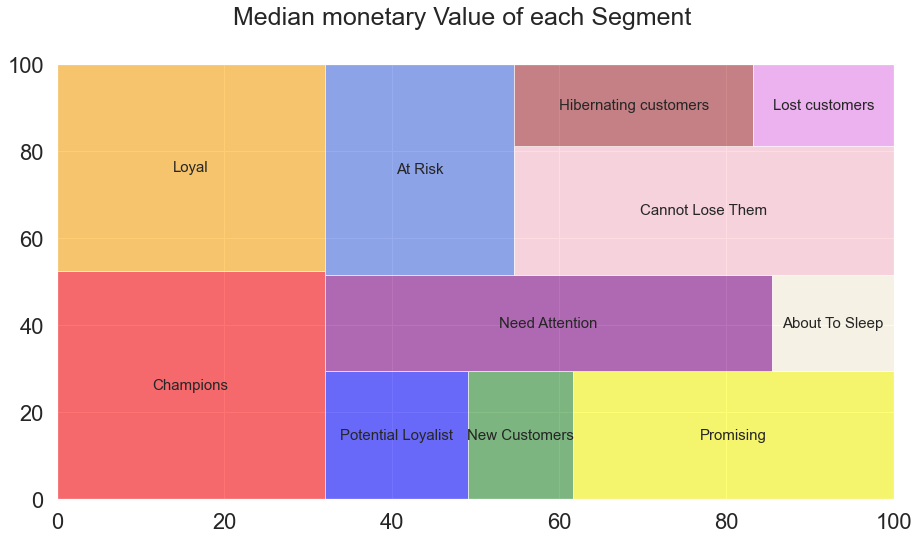

In [56]:
# Treemap with size = Monetary Value
plt.figure(figsize=(15,8))
plt.rc('font', size=15)
squarify.plot(sizes=rfm_stats["monetary"]['median'], label=rfm_stats.index, 
              color=["red","orange","blue", "forestgreen", "yellow", "purple", "cornsilk","royalblue", "pink", "brown","violet"], alpha=.55)
plt.suptitle("Median monetary Value of each Segment", fontsize=25);

We can observe that "Champions" are indeed the most profitable segment by monetary value (Largest area), followed by "Loyal". 

In [57]:
rfm_df['segment'].value_counts()

Potential Loyalist       17568
At Risk                  16170
Promising                12020
Hibernating customers     8476
Loyal                     6061
About To Sleep            5871
Cannot Lose Them          5860
Need Attention            5777
Champions                 5729
New Customers             5201
Lost customers            4662
Name: segment, dtype: int64

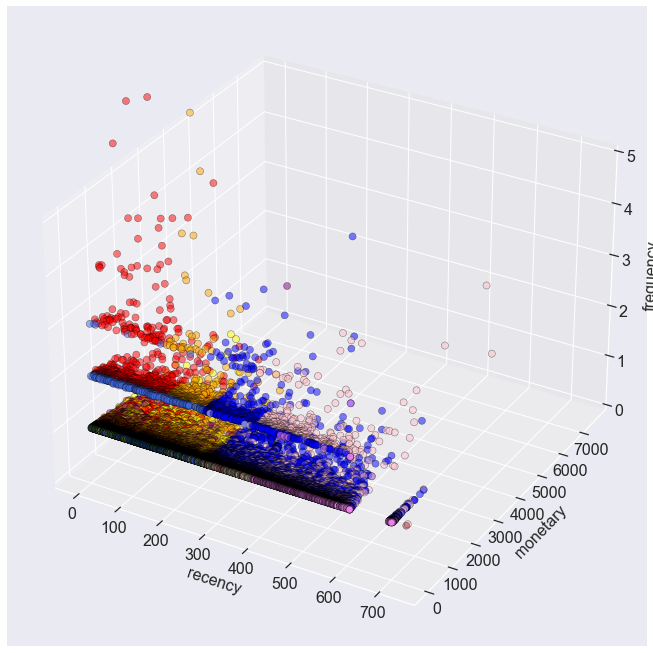

<Figure size 432x288 with 0 Axes>

In [58]:
from mpl_toolkits.mplot3d import Axes3D
import matplotlib.patches as mpatches

fig = plt.figure()
fig.set_size_inches(40, 40)
# ax = Axes3D(fig)
ax = fig.add_subplot(322, projection='3d')
colors={'Champions':"red",'Loyal':"orange",'At Risk':"blue", 'New Customers':"forestgreen", 'Promising':"yellow", 'Need Attention':"purple", 'About To Sleep':"cornsilk",'Potential Loyalist':"royalblue","Cannot Lose Them":"pink","Hibernating customers":"brown","Lost customers":"violet"}

# Set up ax and cbar for the plot
# Select three attributes for the obervartion
img = ax.scatter(rfm_df["recency"], rfm_df["monetary"], rfm_df["frequency"], c=rfm_df["segment"].\
                 apply(lambda x: colors[x]),s=50,edgecolors='black',linewidths=0.5,alpha=0.5)

ax.set_xlabel("recency",fontsize=16)
ax.set_ylabel("monetary",fontsize=16)
ax.set_zlabel("frequency",fontsize=16)

ax.set_zlim(0,5)

ax.tick_params(axis='both', which='major', pad=0,labelsize=16)

# r_patch = mpatches.Patch(color='r', label='1')
# g_patch = mpatches.Patch(color='g', label='0')

#plt.legend(handles=[r_patch, g_patch],title='prevalentHyp')

#cbar.set_label('prevalentHyp')

plt.show()
plt.tight_layout()

## Measuring Cluster Quality

When ground truth is unknown, the following can be used to evaluate clustering algos:
- SSE (Lower Better)
- Silhouette Coefficient (Higher Better)
- Davies-Bouldin Index (Lower Better)
- Calinski-Harabasz Index (Higher Better)

For computational efficiency, in this case, we use the Davies-Bouldin Index & the Calinski-Harabasz Index

In [59]:
#Normalize RFM
scaler = StandardScaler()
scoring_df = scaler.fit_transform(rfm_df[['recency','frequency','monetary']])
scoring_df = pd.DataFrame(scoring_df)

In [60]:
rfm_ch_score = round(calinski_harabasz_score(scoring_df,rfm_df['segment']),2)
rfm_db_score = round(davies_bouldin_score(scoring_df,rfm_df['segment']),2)
print(f"Calinski Harabasz Score: {rfm_ch_score}")
print(f"Davies-Bouldin Index Score: {rfm_db_score}")

Calinski Harabasz Score: 4590.05
Davies-Bouldin Index Score: 4.35


# Data Mining Clustering Methods

In [61]:
grouped_df.sample(10)

,customer_unique_id,latest_order,customer_state,frequency,mean_num_installments,monetary,mean_review_score,product_category,boleto,credit_card,debit_card,voucher,recency,most_exp_category
2347,066d4b591fafe57b3cef590f31e301ac,2017-12-06 23:55:34,MG,1,3.0,101.34,4.0,{perfumery},0.0,1.0,0.0,0.0,270,perfumery
89713,f5b9df32337b8d647f0137a9add720e7,2018-07-05 00:44:25,SP,1,3.0,36.46,5.0,{auto},0.0,1.0,0.0,0.0,60,auto
83901,e5ab9d9cc98f8d5befc51f952a44c87b,2017-07-11 08:20:00,MG,1,1.0,164.38,4.0,{cool_stuff},1.0,0.0,0.0,0.0,419,cool_stuff
37190,65859c1624b7642ec285b4a71efd9506,2018-05-01 12:22:52,SP,2,2.5,160.06,5.0,"{telephony, drinks}",0.0,1.0,0.0,0.0,124,drinks
80408,dc0c390d282366e451452dc72340b949,2018-05-10 20:04:34,MG,1,1.0,162.19,1.0,{watches_gifts},0.0,1.0,0.0,0.0,115,watches_gifts
18670,3300d15602bbdfa988f7f5958cbd7457,2017-05-22 11:43:01,SP,1,10.0,180.77,5.0,{bed_bath_table},0.0,1.0,0.0,0.0,468,bed_bath_table
60553,a5b60293a08b94567cf1c8fbb392c71b,2018-03-03 18:57:38,RN,1,10.0,329.30,4.0,{bed_bath_table},0.0,1.0,0.0,0.0,183,bed_bath_table
3531,0980adc99590048735ae43d0cc619550,2017-08-09 20:07:05,SC,1,4.0,399.81,5.0,{auto},0.0,1.0,0.0,0.0,389,auto
60802,a65b7ba0a1002c23491cc7cd882cf4fe,2018-03-28 09:18:22,RS,1,1.0,104.99,4.0,{computers_accessories},0.0,1.0,0.0,0.0,158,computers_accessories
52358,8f9ae819f77c7927206bf265db9f1289,2017-09-18 22:17:09,SP,1,1.0,80.20,1.0,{sports_leisure},0.0,1.0,0.0,0.0,349,sports_leisure


In [62]:
#Obtain all continuous variables for K-Means
continuous_df = grouped_df[['recency','frequency','monetary','mean_num_installments',
               'mean_review_score','boleto','credit_card','debit_card','voucher',]]

scaler = StandardScaler()
normalized_df = scaler.fit_transform(continuous_df)
normalized_df = pd.DataFrame(normalized_df).set_index(grouped_df['customer_unique_id'])
normalized_df = normalized_df.rename(columns={0: 'z_frequency', 1:'z_recency', 2:'z_monetary',3:'z_installments', 
                      4:'z_review_score', 5:'z_boleto',6:'z_creditcard',7:'z_debitcard',8:'z_voucher'})

# Dimensionality Reduction

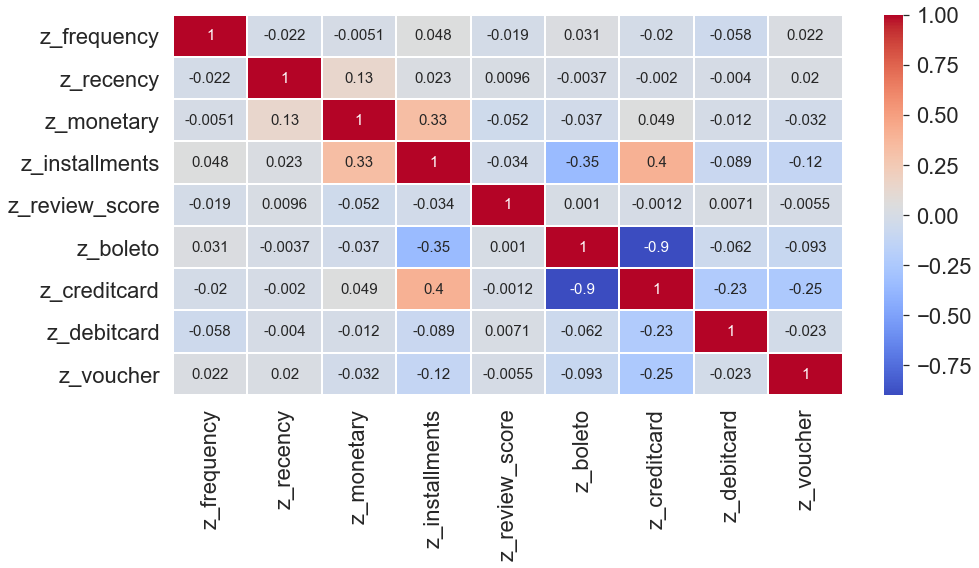

In [63]:
# Correlation of variables to consider dropping any
plt.figure(figsize=(15,7))
sns.heatmap(normalized_df.corr(),lw=0.01,cmap='coolwarm',annot=True)
plt.show()

### Principal Component Analysis (PCA)

In [64]:
pca = PCA()
pcomps = pca.fit_transform(normalized_df)
exp_var_pca = pca.explained_variance_ratio_
cum_sum_eigenvalues = np.cumsum(exp_var_pca)

In [65]:
plt.rcParams["figure.figsize"] = (12,8)

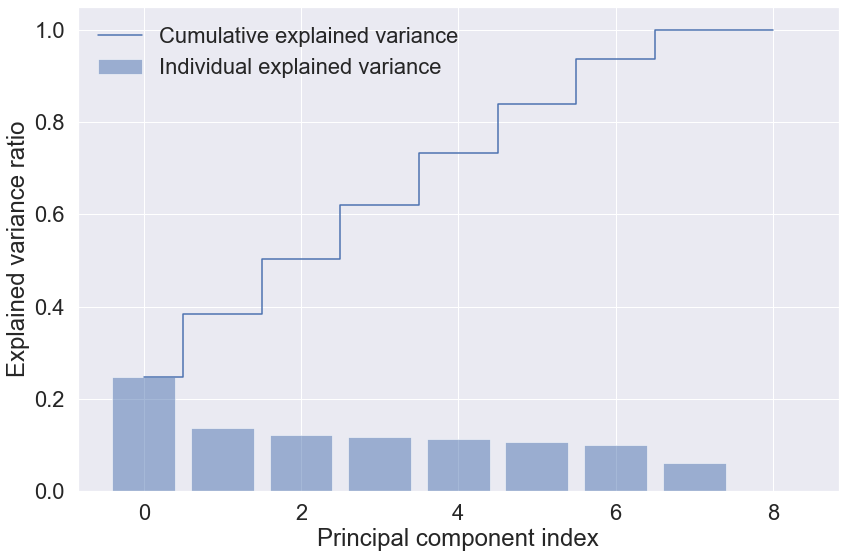

In [66]:
plt.bar(range(0,len(exp_var_pca)), exp_var_pca, alpha=0.5, align='center', label='Individual explained variance')
plt.step(range(0,len(cum_sum_eigenvalues)), cum_sum_eigenvalues, where='mid',label='Cumulative explained variance')
plt.ylabel('Explained variance ratio')
plt.xlabel('Principal component index')
plt.legend(loc='upper left')
plt.tight_layout()
plt.show()

In [67]:
# 6 PCA Components explain > 80% of variance in data.
cum_sum_eigenvalues

array([0.24652768, 0.38294613, 0.50396404, 0.62148548, 0.73347997,
       0.8394548 , 0.93858216, 1.        , 1.        ])

In [ ]:
# Use 6 Principal Components. Allows us to reduce dimensionality while still maintaining significant amount of variance in data
pca = PCA(n_components=6)
pcomps = pca.fit_transform(normalized_df)
pca_df = pd.DataFrame(data = pcomps, columns = ['PC 1', 'PC 2', 'PC 3', 'PC 4', 'PC 5', 'PC 6'])

# K-Means: RFM + Other Continuous Variables

In this portion, K-Means clustering is undertaken on ALL continuous variables. This include RFM variables and other continuous variables present in dataset

## With PCA

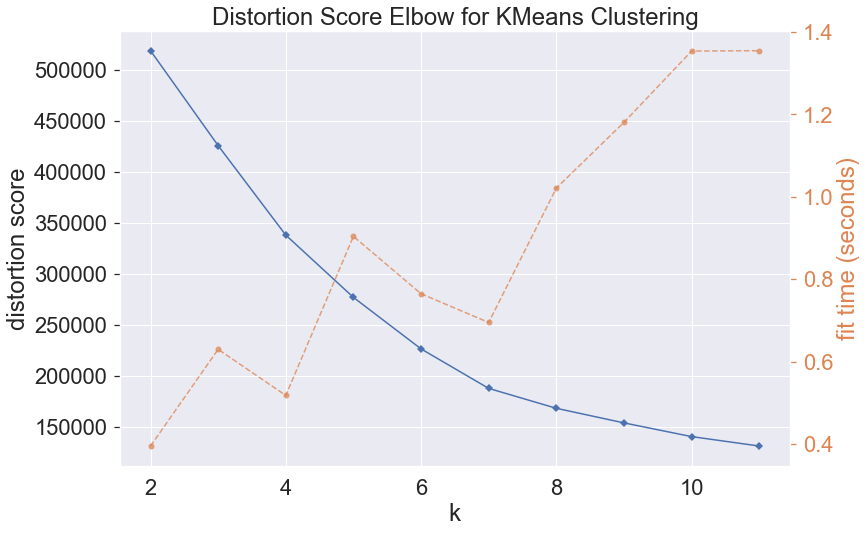

<AxesSubplot: title={'center': 'Distortion Score Elbow for KMeans Clustering'}, xlabel='k', ylabel='distortion score'>

In [69]:
#Visualise SSE for K=2 to K=12
k_means = KMeans()
pca_sse_elbow = KElbowVisualizer(k_means, k=(2, 12),locate_elbow=False)
pca_sse_elbow.fit(pca_df)
pca_sse_elbow.show()

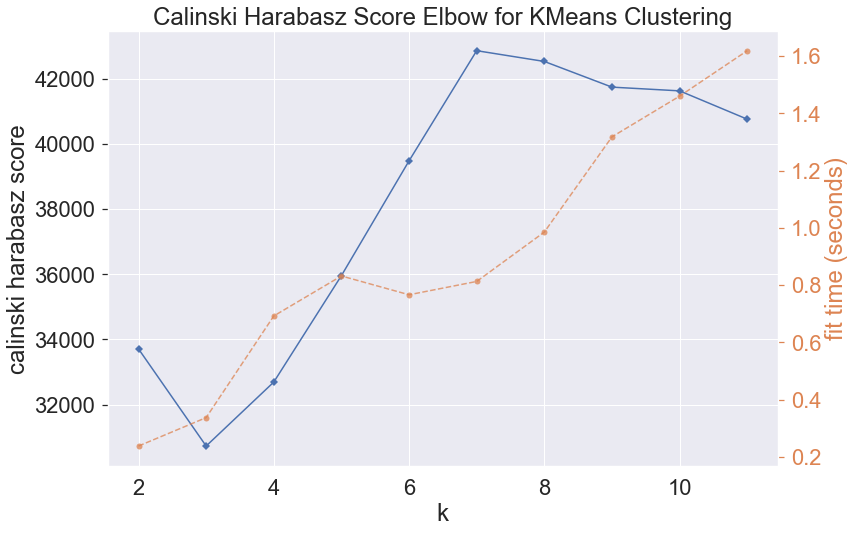

<AxesSubplot: title={'center': 'Calinski Harabasz Score Elbow for KMeans Clustering'}, xlabel='k', ylabel='calinski harabasz score'>

In [70]:
#Visualise Calinski Harabasz Index for K=2 to K=12

k_means = KMeans()
pca_ch_elbow = KElbowVisualizer(k_means, k=(2, 12),metric='calinski_harabasz',locate_elbow=False)
pca_ch_elbow.fit(pca_df)
pca_ch_elbow.show()

In [71]:
# Optimal no. clusters appears to be 7 
print("The Optimal no. of clusters is 7")
print("SSE of k=7 ",pca_sse_elbow.k_scores_[6])
print("Calinski Harabasz score of k=7 ",pca_ch_elbow.k_scores_[6])

The Optimal no. of clusters is 7
SSE of k=7  168482.75581727555
Calinski Harabasz score of k=7  42531.253001674966


## Without PCA

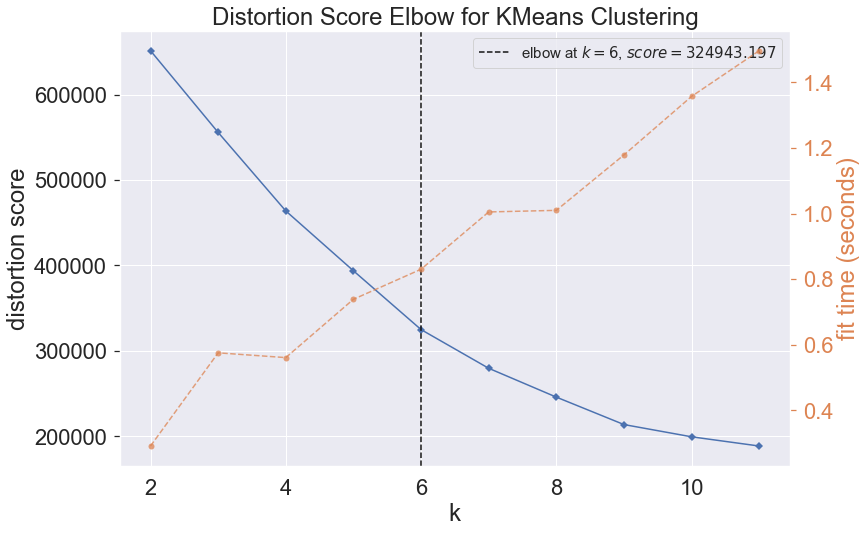

<AxesSubplot: title={'center': 'Distortion Score Elbow for KMeans Clustering'}, xlabel='k', ylabel='distortion score'>

In [72]:
#Visualise SSE for K=2 to K=12

k_means = KMeans()
wopca_sse_elbow = KElbowVisualizer(k_means, k=(2, 12),locate_elbow=True)
wopca_sse_elbow.fit(normalized_df)
wopca_sse_elbow.show()

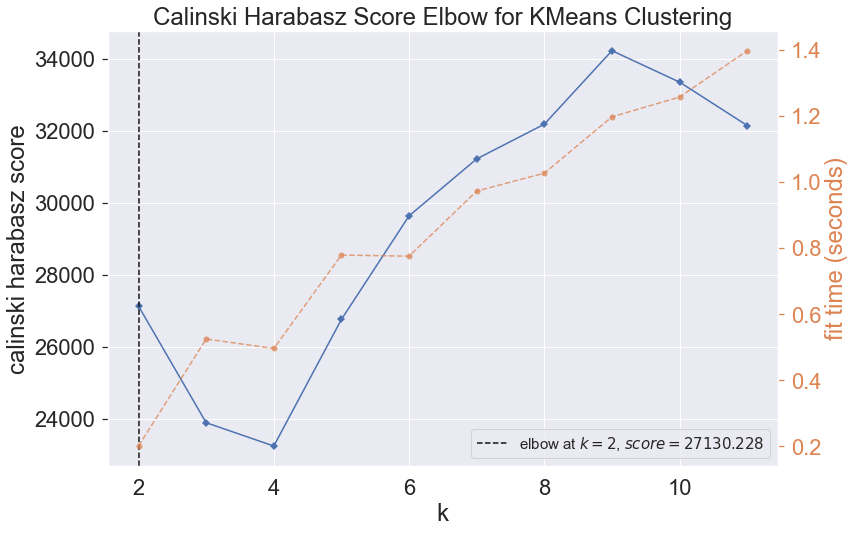

<AxesSubplot: title={'center': 'Calinski Harabasz Score Elbow for KMeans Clustering'}, xlabel='k', ylabel='calinski harabasz score'>

In [73]:
#Visualise Calinski Harabasz Index for K=2 to K=12

k_means = KMeans()
wopca_ch_elbow = KElbowVisualizer(k_means, k=(2, 12),metric='calinski_harabasz',locate_elbow=True)
wopca_ch_elbow.fit(normalized_df)
wopca_ch_elbow.show()

In [74]:
print("The Optimal no. of clusters is 6")
print("SSE of k=6 ",wopca_sse_elbow.k_scores_[5])
print("Calinski Harabasz score of k=6 ",wopca_ch_elbow.k_scores_[5])

The Optimal no. of clusters is 6
SSE of k=6  279640.6187624525
Calinski Harabasz score of k=6  31220.213930333663


|          Metric         | KMeans With PCA (k=7) | KMeans w/o PCA (k=6)|
|:-----------------------:|:---------------:|:----------------:|
| SSE                     |       168482.76          |  279640.62               |
| Calinski Harabasz Score |           42531.25      |    31220.21              |

### With PCA and k=7, SSE is lower and Calinsku Harabasz score is Higher. We proceed with PCA and K=7

In [75]:
kmeans= KMeans(n_clusters=7)
kmeans.fit(pca_df)
pca_df['cluster']= kmeans.labels_
print("Calinski Harabasz Score",calinski_harabasz_score(pca_df,pca_df['cluster']))
print("Davies Bouldin Score",davies_bouldin_score(pca_df,pca_df['cluster']))

Calinski Harabasz Score 84145.5890022497
Davies Bouldin Score 0.7774259370742506


## K-Means vs RFM Analysis

K-Means Algorithm using all continuous variables and PCA outperforms RFM only segmentation with higher Calinski Harabasz Score & lower Davies Bouldin Score

|          Metric         | KMeans With PCA | RFM Segmentation |
|:-----------------------:|:---------------:|:----------------:|
| Calinski Harabasz Score |       75924.21          |  4590.05                |
|   Davies Bouldin Score  |           0.76      |    4.35              |

## K-Prototypes: Categorical + Continuous Variables

##### Creating grouped_df_2 dataframe but the payment types - boleto, credit card, debit card and voucher use max instead of mean

In [206]:
grouped_df_2 = subset_df.groupby('customer_unique_id',as_index=False).agg(
    {'order_purchase_timestamp':'max',
     'customer_state':'first',
     'customer_id': pd.Series.nunique, #Frequency of orders
     'payment_installments':'mean',
     'payment_value':'sum', #Total sum spent per customer (i.e Monetary)
     'review_score':'mean',
     'product_category':set,
    'boleto':'max', #Max is used to determine whether customer has ever used the payment method
    'credit_card':'max', #Max is used to determine whether customer has ever used the payment method
    'debit_card':'max', #Max is used to determine whether customer has ever used the payment method
    'voucher':'max', #Max is used to determine whether customer has ever used the payment method
    'order_recency':'min'}) #Most Recent Order


grouped_df_2= grouped_df.rename(columns={'order_purchase_timestamp':'latest_order',
                                       'customer_id':'frequency',
                                       'payment_installments':'mean_num_installments',
                                       'payment_value':'monetary',
                                       'review_score':'mean_review_score', 
                                       'order_recency':'recency'
                                      })

### Divide Categorical & Continuous Variables

In [207]:
df_cat = grouped_df_2[['customer_unique_id','customer_state','boleto','credit_card','debit_card','voucher','most_exp_category']]
df_num = grouped_df_2[['recency','frequency','monetary','mean_review_score','mean_num_installments']]

### Normalize Continuous Variables and apply PCA

In [208]:
scaler = StandardScaler()
normalized_df2 = scaler.fit_transform(df_num)
normalized_df2 = pd.DataFrame(normalized_df2).set_index(grouped_df_2['customer_unique_id'])
normalized_df2 = normalized_df2.rename(columns={0: 'recency_z', 1:'frequency_z', 2:'monetary_z',3:'mean_review_score_z', 4:'mean_num_installments_z'})

In [209]:
normalized_df2.head()

,recency_z,frequency_z,monetary_z,mean_review_score_z,mean_num_installments_z
customer_unique_id,,,,,
0000366f3b9a7992bf8c76cfdf3221e2,-0.827498,-0.160427,-0.114409,0.676025,1.900282
0000b849f77a49e4a4ce2b2a4ca5be3f,-0.807911,-0.160427,-0.617297,-0.079028,-0.711086
0000f46a3911fa3c0805444483337064,1.953827,-0.160427,-0.358510,-0.834081,1.900282
0000f6ccb0745a6a4b88665a16c9f078,0.543578,-0.160427,-0.545268,-0.079028,0.408072
0004aac84e0df4da2b147fca70cf8255,0.328123,-0.160427,0.126667,0.676025,1.154177


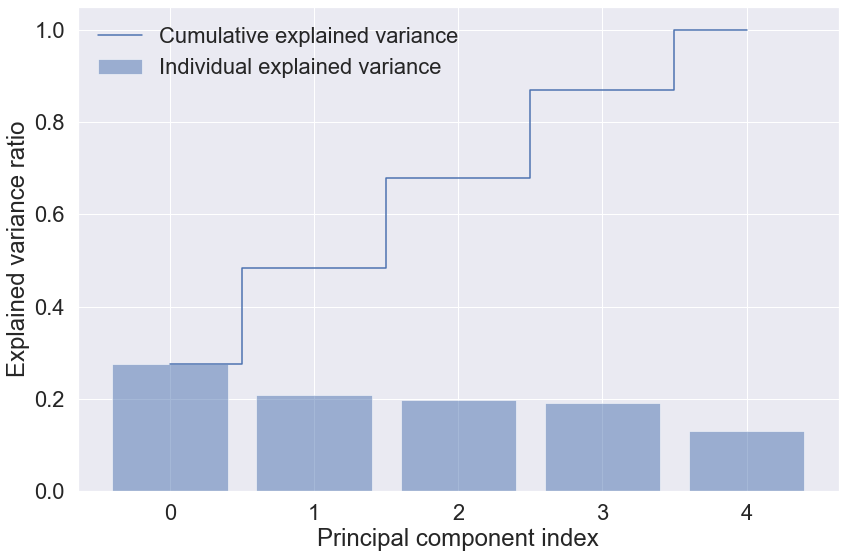

In [210]:
pca = PCA()
pcomps = pca.fit_transform(normalized_df2)
exp_var_pca = pca.explained_variance_ratio_
cum_sum_eigenvalues = np.cumsum(exp_var_pca)

plt.bar(range(0,len(exp_var_pca)), exp_var_pca, alpha=0.5, align='center', label='Individual explained variance')
plt.step(range(0,len(cum_sum_eigenvalues)), cum_sum_eigenvalues, where='mid',label='Cumulative explained variance')
plt.ylabel('Explained variance ratio')
plt.xlabel('Principal component index')
plt.legend(loc='upper left')
plt.tight_layout()
plt.show()

In [211]:
# We use 4 PCs since exlained var ratio > 0.8
cum_sum_eigenvalues

array([0.27433248, 0.48318197, 0.67965568, 0.86991324, 1.        ])

In [212]:
# Use 4 Principal Components. Allows us to reduce dimensionality while still maintaining significant amount of variance in data
pca = PCA(n_components=4)
pcomps = pca.fit_transform(normalized_df2)
pca_df = pd.DataFrame(data = pcomps, columns = ['PC 1', 'PC 2', 'PC 3', 'PC 4'])

In [213]:
pca_df = pca_df.set_index(grouped_df_2['customer_unique_id'])

In [214]:
pca_df

,PC 1,PC 2,PC 3,PC 4
customer_unique_id,,,,
0000366f3b9a7992bf8c76cfdf3221e2,0.948320,0.428080,-0.393983,-1.334409
0000b849f77a49e4a4ce2b2a4ca5be3f,-0.970868,0.475955,0.593974,-0.222162
0000f46a3911fa3c0805444483337064,1.187966,-2.097803,-0.597557,0.562104
0000f6ccb0745a6a4b88665a16c9f078,-0.110632,-0.598277,-0.276315,0.115499
0004aac84e0df4da2b147fca70cf8255,0.707142,-0.192946,-0.900388,-0.518621
...,...,...,...,...
fffcf5a5ff07b0908bd4e2dbc735a684,7.398685,-0.475726,-1.671144,-1.336906
fffea47cd6d3cc0a88bd621562a9d061,-0.734827,-0.143103,0.083248,0.254460
ffff371b4d645b6ecea244b27531430a,-0.635774,-1.121182,-1.604454,1.072336


### Combine Categorical Data and PCs

In [215]:
final_df = df_cat.merge(pca_df,left_on='customer_unique_id',right_index=True)

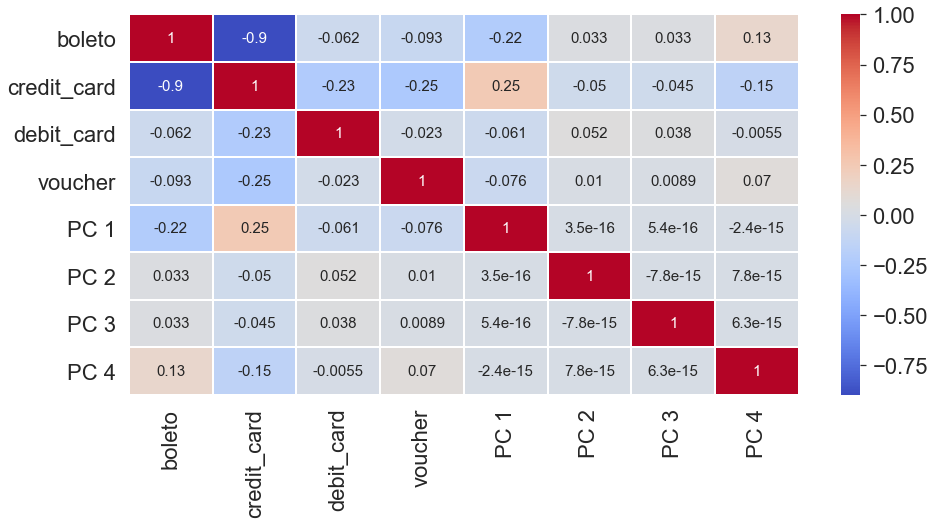

In [216]:
plt.figure(figsize=(15,7))
sns.heatmap(final_df.corr(),lw=0.01,cmap='coolwarm',annot=True)
plt.show()

In [217]:
categorical_index = list(range(0,6))
X = final_df.iloc[:,1:]

In [218]:
X3 = X.sample(frac=0.6)

### Due to Long Runtime we use the same no.clusters as K-Means 

In [219]:
# Fitting on 100% sample of data
start=datetime.now()

kproto = KPrototypes(n_clusters=7, init='Cao',n_jobs=4)
clusters = kproto.fit_predict(X, categorical=categorical_index)

# Running Time
print()
print('Time taken:')
print(datetime.now()-start)


Time taken:
0:24:07.267177


In [220]:
#join data with labels 
labels = pd.DataFrame(clusters).set_index(grouped_df_2['customer_unique_id'])
labeled_df = final_df.merge(labels,left_on='customer_unique_id',right_index=True)
labeled_df = labeled_df.rename({0:'cluster'},axis=1)

In [221]:
labeled_df['cluster'].value_counts()

0    26075
2    23361
5    15753
4    12617
6    11093
1     2789
3     1707
Name: cluster, dtype: int64

In [222]:
labeled_df

,customer_unique_id,customer_state,boleto,credit_card,debit_card,voucher,most_exp_category,PC 1,PC 2,PC 3,PC 4,cluster
0,0000366f3b9a7992bf8c76cfdf3221e2,SP,0.0,1.0,0.0,0.0,bed_bath_table,0.948320,0.428080,-0.393983,-1.334409,6
1,0000b849f77a49e4a4ce2b2a4ca5be3f,SP,0.0,1.0,0.0,0.0,health_beauty,-0.970868,0.475955,0.593974,-0.222162,0
2,0000f46a3911fa3c0805444483337064,SC,0.0,1.0,0.0,0.0,stationery,1.187966,-2.097803,-0.597557,0.562104,5
3,0000f6ccb0745a6a4b88665a16c9f078,PA,0.0,1.0,0.0,0.0,telephony,-0.110632,-0.598277,-0.276315,0.115499,2
4,0004aac84e0df4da2b147fca70cf8255,SP,0.0,1.0,0.0,0.0,telephony,0.707142,-0.192946,-0.900388,-0.518621,6
...,...,...,...,...,...,...,...,...,...,...,...,...
93391,fffcf5a5ff07b0908bd4e2dbc735a684,PE,0.0,1.0,0.0,0.0,health_beauty,7.398685,-0.475726,-1.671144,-1.336906,3
93392,fffea47cd6d3cc0a88bd621562a9d061,BA,0.0,1.0,0.0,0.0,baby,-0.734827,-0.143103,0.083248,0.254460,2
93393,ffff371b4d645b6ecea244b27531430a,MT,0.0,1.0,0.0,0.0,auto,-0.635774,-1.121182,-1.604454,1.072336,5
93394,ffff5962728ec6157033ef9805bacc48,ES,0.0,1.0,0.0,0.0,watches_gifts,0.203578,0.576811,-0.265066,-0.944297,0


## Measuring Cluster Quality

In [223]:
kproto_scoring_df = labeled_df[['PC 1','PC 2','PC 3', 'PC 4']]

In [224]:
kproto_ch_score = round(calinski_harabasz_score(kproto_scoring_df,labeled_df['cluster']),2)
kproto_db_score = round(davies_bouldin_score(kproto_scoring_df,labeled_df['cluster']),2)
print(f"Calinski Harabasz Score: {kproto_ch_score}")
print(f"Davies-Bouldin Index Score: {kproto_db_score}")

Calinski Harabasz Score: 38324.48
Davies-Bouldin Index Score: 1.01


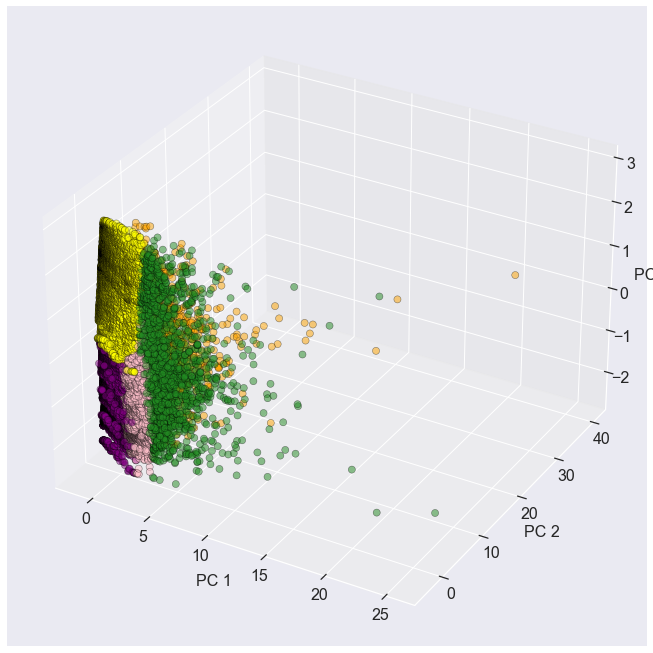

<Figure size 864x576 with 0 Axes>

In [225]:
fig = plt.figure()
fig.set_size_inches(40, 40)
# ax = Axes3D(fig)
ax = fig.add_subplot(322, projection='3d')
colors={0:"red",1:"orange",2:"blue",3:"forestgreen",4:"yellow",5:"purple",6:"pink"}

img = ax.scatter(labeled_df["PC 1"], labeled_df["PC 2"], labeled_df["PC 3"], c=labeled_df["cluster"].\
                 apply(lambda x: colors[x]),s=50,edgecolors='black',linewidths=0.5,alpha=0.5)

ax.set_xlabel("PC 1",fontsize=16)
ax.set_ylabel("PC 2",fontsize=16)
ax.set_zlabel("PC 4",fontsize=16)

#ax.set_zlim(0,5)

ax.tick_params(axis='both', which='major', pad=0,labelsize=16)

plt.show()
plt.tight_layout()

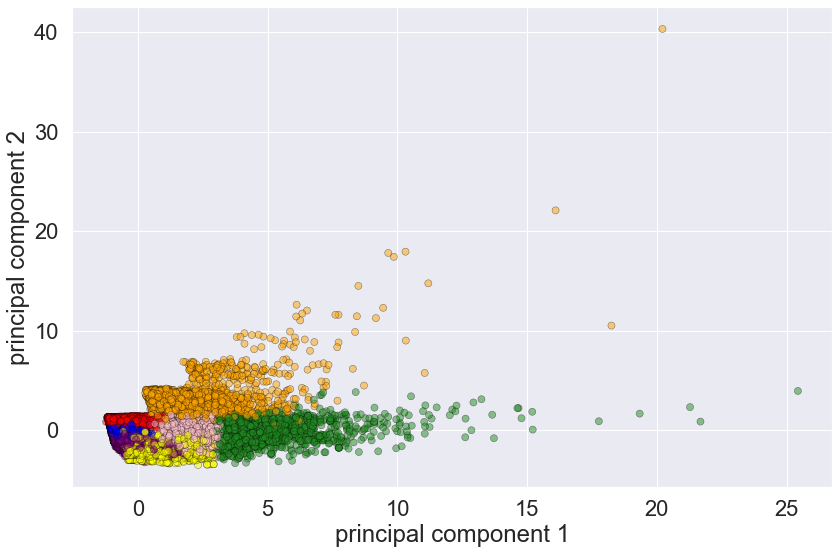

In [226]:
#2D Plot
fig = plt.figure()
fig.set_size_inches(30, 30)
ax = fig.add_subplot(322)

colors={0:"red",1:"orange",2:"blue",3:"forestgreen",4:"yellow",5:"purple",6:"pink"}


img = ax.scatter(labeled_df["PC 1"], labeled_df["PC 2"], c=labeled_df["cluster"].\
                 apply(lambda x: colors[x]),s=50,edgecolors='black',linewidths=0.5,alpha=0.5)


ax.set_xlabel("principal component 1")
ax.set_ylabel("principal component 2")

plt.show()

## Segmentation Summary

K-Means with PCA provides the best clustering with highest Calinski Harabasz Score and lowest Davies-Bouldin Index Score

## Final Clustering Model

In [167]:
#Obtain all continuous variables for K-Means
continuous_df = grouped_df[['recency','frequency','monetary','mean_num_installments',
               'mean_review_score','boleto','credit_card','debit_card','voucher',]]

scaler = StandardScaler()
normalized_df = scaler.fit_transform(continuous_df)
normalized_df = pd.DataFrame(normalized_df).set_index(grouped_df['customer_unique_id'])
normalized_df = normalized_df.rename(columns={0: 'z_frequency', 1:'z_recency', 2:'z_monetary',3:'z_installments', 
                      4:'z_review_score', 5:'z_boleto',6:'z_creditcard',7:'z_debitcard',8:'z_voucher'})

pca = PCA(n_components=6)
pcomps = pca.fit_transform(normalized_df)
pca_df = pd.DataFrame(data = pcomps, columns = ['PC 1', 'PC 2', 'PC 3', 'PC 4', 'PC 5', 'PC 6']).set_index(grouped_df['customer_unique_id'])

kmeans= KMeans(n_clusters=7, random_state=42)
kmeans.fit(pca_df)
pca_df['cluster_1']= kmeans.labels_

In [168]:
final_df = grouped_df.merge(pca_df['cluster_1'],left_on='customer_unique_id',right_index=True)

In [169]:
final_df.head()

,customer_unique_id,latest_order,customer_state,frequency,mean_num_installments,monetary,mean_review_score,product_category,boleto,credit_card,debit_card,voucher,recency,most_exp_category,cluster_1
0,0000366f3b9a7992bf8c76cfdf3221e2,2018-05-10 10:56:27,SP,1,8.0,141.90,5.0,{bed_bath_table},0.0,1.0,0.0,0.0,115,bed_bath_table,1
1,0000b849f77a49e4a4ce2b2a4ca5be3f,2018-05-07 11:11:27,SP,1,1.0,27.19,4.0,{health_beauty},0.0,1.0,0.0,0.0,118,health_beauty,1
2,0000f46a3911fa3c0805444483337064,2017-03-10 21:05:03,SC,1,8.0,86.22,3.0,{stationery},0.0,1.0,0.0,0.0,541,stationery,0
3,0000f6ccb0745a6a4b88665a16c9f078,2017-10-12 20:29:41,PA,1,4.0,43.62,4.0,{telephony},0.0,1.0,0.0,0.0,325,telephony,0
4,0004aac84e0df4da2b147fca70cf8255,2017-11-14 19:45:42,SP,1,6.0,196.89,5.0,{telephony},0.0,1.0,0.0,0.0,292,telephony,0


In [170]:
cluster_stats = final_df[['customer_state','recency','frequency','monetary','mean_review_score','boleto','credit_card','debit_card','voucher','most_exp_category','cluster_1']]\
         .groupby('cluster_1').agg({
    'customer_state':['count',pd.Series.mode],
    'recency':'median',
    'frequency':'median',
    'monetary':'median',
    'mean_review_score':'mean',
    'boleto':'mean',
    'credit_card':'mean',
    'debit_card':'mean',
    'voucher':'mean',
    'most_exp_category':pd.Series.mode
})

In [171]:
cluster_stats

customer_state      recency frequency monetary mean_review_score  \
                   count mode  median    median   median              mean   
cluster_1                                                                    
0                  21681   SP   395.0       1.0  125.520          4.618814   
1                  33658   SP   137.0       1.0   92.780          4.625780   
2                  18190   SP   235.0       1.0   93.835          4.106982   
3                   3462   SP   246.5       1.0   86.730          4.075371   
4                   1422   SP   130.0       1.0   89.690          4.175457   
5                   3937   SP   186.0       2.0  464.070          4.179021   
6                  11045   SP   210.0       1.0  133.380          1.477139   

             boleto credit_card debit_card   voucher most_exp_category  
               mean        mean       mean      mean              mode  
cluster_1                                                               
0          0.000000    0.999962   0.000000  0.000038    bed_bath_table  
1          0.000000    0.999990   0.000000  0.000010     health_beauty  
2          0.999973    0.000000   0.000027  0.000000     health_beauty  
3          0.002672    0.282700   0.000241  0.714388    bed_bath_table  
4          0.000000    0.000000   1.000000  0.000000     health_beauty  
5          0.103379    0.880160   0.005503  0.010958    bed_bath_table  
6          0.000000    0.999743   0.000000  0.000257    bed_bath_table

### Cluster Interpretation

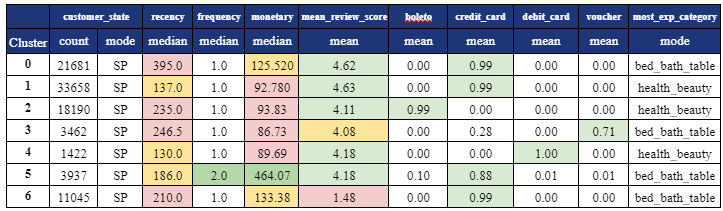

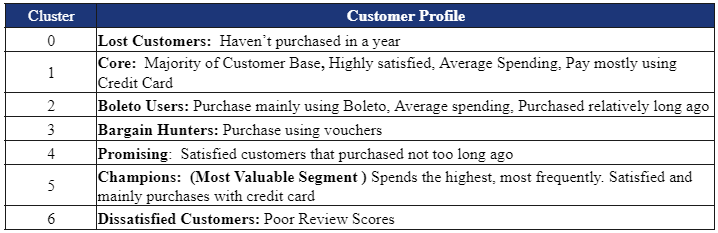

From the 2 tables above, we can interpret the final clusters produced by the K-Means model. Given that the purpose of this project is not to actually analyse the consumer segments of Olist customers, we would not be analysing the customer profiles any further. The tables above are displayed simply to show that it is possible to profile customer segments created via clustering algorithms using business domain knowledge. How it is done, however, is up to the firms themselves.

# Classification

Clustering algorithms are more computationally intensive than classification algorithms. In this project, we explore clustering on a subset of the data and use a classification model to predict the cluster/market segment of new customers or the same customer when new purchases are made. 

This removes the need to recalculate centroids everytime a new customer makes a purchase or an existing customer makes a purchase.

In [188]:
class_df = final_df[['customer_unique_id','customer_state','recency','frequency','monetary','mean_review_score','mean_num_installments','boleto',
                     'credit_card','debit_card','voucher','most_exp_category','cluster_1']]

In [189]:
class_df.head()

,customer_unique_id,customer_state,recency,frequency,monetary,mean_review_score,mean_num_installments,boleto,credit_card,debit_card,voucher,most_exp_category,cluster_1
0,0000366f3b9a7992bf8c76cfdf3221e2,SP,115,1,141.90,5.0,8.0,0.0,1.0,0.0,0.0,bed_bath_table,1
1,0000b849f77a49e4a4ce2b2a4ca5be3f,SP,118,1,27.19,4.0,1.0,0.0,1.0,0.0,0.0,health_beauty,1
2,0000f46a3911fa3c0805444483337064,SC,541,1,86.22,3.0,8.0,0.0,1.0,0.0,0.0,stationery,0
3,0000f6ccb0745a6a4b88665a16c9f078,PA,325,1,43.62,4.0,4.0,0.0,1.0,0.0,0.0,telephony,0
4,0004aac84e0df4da2b147fca70cf8255,SP,292,1,196.89,5.0,6.0,0.0,1.0,0.0,0.0,telephony,0


### Label Encoding

In [190]:
from sklearn import preprocessing
from sklearn.model_selection import train_test_split

In [191]:
for column in class_df.columns[1:]:
    if class_df[column].dtype == type(object):
        le = preprocessing.LabelEncoder()
        class_df[column] = le.fit_transform(class_df[column])
        
class_df.head()

,customer_unique_id,customer_state,recency,frequency,monetary,mean_review_score,mean_num_installments,boleto,credit_card,debit_card,voucher,most_exp_category,cluster_1
0,0000366f3b9a7992bf8c76cfdf3221e2,25,115,1,141.90,5.0,8.0,0.0,1.0,0.0,0.0,7,1
1,0000b849f77a49e4a4ce2b2a4ca5be3f,25,118,1,27.19,4.0,1.0,0.0,1.0,0.0,0.0,43,1
2,0000f46a3911fa3c0805444483337064,23,541,1,86.22,3.0,8.0,0.0,1.0,0.0,0.0,66,0
3,0000f6ccb0745a6a4b88665a16c9f078,13,325,1,43.62,4.0,4.0,0.0,1.0,0.0,0.0,68,0
4,0004aac84e0df4da2b147fca70cf8255,25,292,1,196.89,5.0,6.0,0.0,1.0,0.0,0.0,68,0


In [192]:
train, test = train_test_split(class_df, test_size=0.33, random_state=42, stratify=class_df['cluster_1'])

In [193]:
train.head()

,customer_unique_id,customer_state,recency,frequency,monetary,mean_review_score,mean_num_installments,boleto,credit_card,debit_card,voucher,most_exp_category,cluster_1
70309,c044ee35e71ce21ccbf8e1495c55c75b,22,59,1,73.49,5.0,4.0,0.0,1.0,0.0,0.0,66,1
5826,0fd239a62abbc756c7fa6c170025d273,25,61,1,58.70,3.0,1.0,1.0,0.0,0.0,0.0,17,2
3455,094fcfe0ec6573b6f2d4146dabaf8d1a,6,293,1,119.39,5.0,1.0,0.0,1.0,0.0,0.0,15,1
63997,af00f5cf86e87b9ace1a6903d2059303,10,367,1,326.82,5.0,6.0,0.0,1.0,0.0,0.0,70,0
59317,a263ae1e24c3a3ec0da03a50a0d85299,25,40,1,50.72,4.0,1.0,0.0,1.0,0.0,0.0,43,1


## Clustering on 2/3 Data Only (Train Data)

In [194]:
#Obtain all continuous variables for K-Means
continuous_df = train[['recency','frequency','monetary','mean_num_installments',
               'mean_review_score','boleto','credit_card','debit_card','voucher']]

scaler = StandardScaler()
normalized_df = scaler.fit_transform(continuous_df)
normalized_df = pd.DataFrame(normalized_df).set_index(train['customer_unique_id'])
normalized_df = normalized_df.rename(columns={0: 'z_frequency', 1:'z_recency', 2:'z_monetary',3:'z_installments', 
                      4:'z_review_score', 5:'z_boleto',6:'z_creditcard',7:'z_debitcard',8:'z_voucher'})

pca = PCA(n_components=6)
pcomps = pca.fit_transform(normalized_df)
pca_df = pd.DataFrame(data = pcomps, columns = ['PC 1', 'PC 2', 'PC 3', 'PC 4', 'PC 5', 'PC 6']).set_index(train['customer_unique_id'])
kmeans= KMeans(n_clusters=7, random_state=42)
kmeans.fit(pca_df)
pca_df['cluster_2']= kmeans.labels_

In [195]:
train = train.merge(pca_df['cluster_2'],left_on='customer_unique_id',right_index=True) 

In [196]:
train

,customer_unique_id,customer_state,recency,frequency,monetary,mean_review_score,mean_num_installments,boleto,credit_card,debit_card,voucher,most_exp_category,cluster_1,cluster_2
70309,c044ee35e71ce21ccbf8e1495c55c75b,22,59,1,73.49,5.0,4.0,0.0,1.000000,0.0,0.000000,66,1,6
5826,0fd239a62abbc756c7fa6c170025d273,25,61,1,58.70,3.0,1.0,1.0,0.000000,0.0,0.000000,17,2,2
3455,094fcfe0ec6573b6f2d4146dabaf8d1a,6,293,1,119.39,5.0,1.0,0.0,1.000000,0.0,0.000000,15,1,6
63997,af00f5cf86e87b9ace1a6903d2059303,10,367,1,326.82,5.0,6.0,0.0,1.000000,0.0,0.000000,70,0,1
59317,a263ae1e24c3a3ec0da03a50a0d85299,25,40,1,50.72,4.0,1.0,0.0,1.000000,0.0,0.000000,43,1,6
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
72149,c574ecf69ca7ba500c1b9d4e27fffe1b,4,456,1,119.93,5.0,5.0,0.0,1.000000,0.0,0.000000,20,0,1
18118,317316ce918b51c2d4e1e7f9af54c434,18,341,1,133.05,5.0,1.0,0.0,1.000000,0.0,0.000000,42,0,1
29413,50593444d10f28505edba3a9e1a6438b,23,223,1,44.10,4.0,1.0,0.0,0.000000,0.0,1.000000,70,3,5
59510,a2d8125361b16f316df65f4603b88e23,22,176,2,498.22,5.0,1.0,0.5,0.500000,0.0,0.000000,5,5,4


## Build a Classification model using cluster_2 as target variable

## Decision Tree

In [159]:
from sklearn.tree import DecisionTreeClassifier
from sklearn.tree import plot_tree

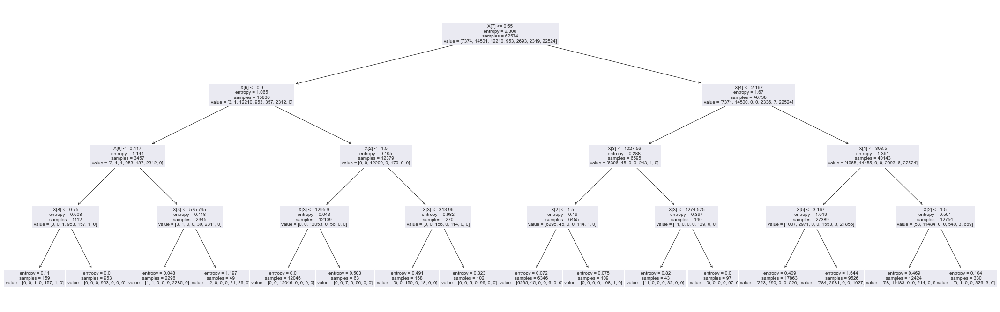

In [160]:
# initialise Decision Tree
clf = DecisionTreeClassifier(criterion='entropy', max_depth=4, random_state=42)

# train model
model = clf.fit(train.iloc[:,1:12], train['cluster_2'])

#plot tree
plt.figure(figsize=(38,12))
plot_tree(model.fit(train.iloc[:,1:12], train['cluster_2']), fontsize=10)
plt.show()

In [161]:
# predict clusters of test data using Decision Tree Classification Model
predictions = clf.predict(test.iloc[:,1:12])
test['cluster_2'] = predictions

## Random Forest

In [181]:
#Import Random Forest Model
from sklearn.ensemble import RandomForestClassifier

#Create a Gaussian Classifier
rf=RandomForestClassifier(n_estimators=100, random_state=42)

#Train the model using the training sets y_pred=rf.predict(X_test)
rf.fit(train.iloc[:,1:12], train['cluster_2'])

RandomForestClassifier(random_state=42)

In [182]:
# predict clusters of test data using Random Forest Classification Model
predictions = rf.predict(test.iloc[:,1:12])
test['cluster_2'] = predictions

## XGBoost

In [197]:
#Import XGBoost Model
from xgboost import XGBClassifier
xgb = XGBClassifier()
xgb.fit(train.iloc[:,1:12], train['cluster_2'])

XGBClassifier(base_score=0.5, booster='gbtree', callbacks=None,
              colsample_bylevel=1, colsample_bynode=1, colsample_bytree=1,
              early_stopping_rounds=None, enable_categorical=False,
              eval_metric=None, feature_types=None, gamma=0, gpu_id=-1,
              grow_policy='depthwise', importance_type=None,
              interaction_constraints='', learning_rate=0.300000012,
              max_bin=256, max_cat_threshold=64, max_cat_to_onehot=4,
              max_delta_step=0, max_depth=6, max_leaves=0, min_child_weight=1,
              missing=nan, monotone_constraints='()', n_estimators=100,
              n_jobs=0, num_parallel_tree=1, objective='multi:softprob',
              predictor='auto', ...)

In [198]:
# predict clusters of test data using XGBoost Classification Model
predictions = rf.predict(test.iloc[:,1:12])
test['cluster_2'] = predictions

## Predict Clusters of Test Data using Classification model

predictions = clf.predict(test.iloc[:,1:12])
test['cluster_2'] = predictions

### Cluster Labels are different so we remap, using cluster size ranking as a proxy

In [199]:
cluster_stats1 = train[['customer_state','recency','frequency','monetary','mean_review_score','boleto','credit_card','debit_card','voucher','most_exp_category','cluster_1']]\
         .groupby('cluster_1').agg({
    'customer_state':['count',pd.Series.mode],
    'recency':'median',
    'frequency':'median',
    'monetary':'median',
    'mean_review_score':'mean',
    'boleto':'mean',
    'credit_card':'mean',
    'debit_card':'mean',
    'voucher':'mean',
    'most_exp_category':pd.Series.mode
})


cluster_stats1.columns = cluster_stats1.columns.to_flat_index().str.join('_')
cluster_stats1.sort_values('customer_state_count')

,customer_state_count,customer_state_mode,recency_median,frequency_median,monetary_median,mean_review_score_mean,boleto_mean,credit_card_mean,debit_card_mean,voucher_mean,most_exp_category_mode
cluster_1,,,,,,,,,,,
4,953,25,135.0,1.0,89.620,4.166317,0.000000,0.000000,1.000000,0.000000,43
3,2319,25,241.0,1.0,86.960,4.071337,0.002480,0.278938,0.000359,0.718223,7
5,2638,25,185.0,2.0,469.245,4.164284,0.101871,0.880963,0.005181,0.011985,7
6,7400,25,209.0,1.0,133.370,1.476081,0.000000,0.999752,0.000000,0.000248,7
2,12187,25,233.0,1.0,93.820,4.110076,0.999959,0.000000,0.000041,0.000000,15
0,14526,25,396.0,1.0,125.880,4.620577,0.000000,0.999943,0.000000,0.000057,7
1,22551,25,136.0,1.0,93.100,4.626269,0.000000,0.999985,0.000000,0.000015,43


In [200]:
cluster_stats2 = train[['customer_state','recency','frequency','monetary','mean_review_score','boleto','credit_card','debit_card','voucher','most_exp_category','cluster_2']]\
         .groupby('cluster_2').agg({
    'customer_state':['count',pd.Series.mode],
    'recency':'median',
    'frequency':'median',
    'monetary':'median',
    'mean_review_score':'mean',
    'boleto':'mean',
    'credit_card':'mean',
    'debit_card':'mean',
    'voucher':'mean',
    'most_exp_category':pd.Series.mode
})

cluster_stats2.columns = cluster_stats2.columns.to_flat_index().str.join('_')
cluster_stats2.sort_values('customer_state_count')

,customer_state_count,customer_state_mode,recency_median,frequency_median,monetary_median,mean_review_score_mean,boleto_mean,credit_card_mean,debit_card_mean,voucher_mean,most_exp_category_mode
cluster_2,,,,,,,,,,,
3,953,25,135.0,1.0,89.620,4.166317,0.000000,0.000000,1.000000,0.000000,43
5,2319,25,241.0,1.0,86.960,4.071337,0.002480,0.278938,0.000359,0.718223,7
4,2693,25,186.0,2.0,504.760,4.163033,0.091250,0.891935,0.005075,0.011740,7
0,7374,25,209.0,1.0,133.340,1.473149,0.000000,0.999751,0.000000,0.000249,7
2,12210,25,233.0,1.0,93.965,4.110715,0.999959,0.000000,0.000041,0.000000,15
1,14501,25,396.0,1.0,124.420,4.619026,0.000000,0.999943,0.000000,0.000057,7
6,22524,25,136.0,1.0,93.345,4.626043,0.000000,0.999985,0.000000,0.000015,43


In [201]:
# Cluster Map
cluster_map = {3:4,5:3,4:5,0:6,2:2,1:0,6:1}


In [202]:
train["cluster_2"] = train["cluster_2"].map(cluster_map)
test['cluster_2'] = test['cluster_2'].map(cluster_map)

In [203]:
from sklearn.metrics import confusion_matrix,accuracy_score,f1_score,precision_score,recall_score

f1=f1_score(test['cluster_1'],test['cluster_2'],average='micro')
accuracy=accuracy_score(test['cluster_1'],test['cluster_2'])
precision=precision_score(test['cluster_1'],test['cluster_2'],average='micro')
recall=recall_score(test['cluster_1'],test['cluster_2'],average='micro')

print ("accuracy: ", accuracy)
print ("precision: ", precision)
print ("recall: ", recall)
print ("f1 score: ", f1)

accuracy:  0.9911424029071088
precision:  0.9911424029071088
recall:  0.9911424029071088
f1 score:  0.9911424029071088
